# **CAPSTONE PROJECT - CV**


## **PROBLEM STATEMENT**
**• DOMAIN: Health Care**

**• CONTEXT:**
Computer vision can be used in health care for identifying diseases. In Pneumonia detection we need to detect Inflammation
of the lungs. In this challenge, you’re required to build an algorithm to detect a visual signal for pneumonia in medical
images. Specifically, your algorithm needs to automatically locate lung opacities on chest radiographs.

**• DATA DESCRIPTION:**
- In the dataset, some of the features are labeled “Not Normal No Lung Opacity”. This extra third class indicates that while pneumonia was
determined not to be present, there was nonetheless some type of abnormality on the image and oftentimes this finding may mimic the
appearance of true pneumonia. Dicom original images: - Medical images are stored in a special format called DICOM files (*.dcm). They
contain a combination of header metadata as well as underlying raw image arrays for pixel data.
- Dataset has been attached along with this project. Please use the same for this capstone project.
- Original link to the dataset :
  
  https://www.kaggle.com/c/rsna-pneumonia-detection-challenge/data

You can refer to the details of the dataset in the above link
- Acknowledgements:

  https://www.kaggle.com/c/rsna-pneumonia-detection-challenge/overview/acknowledgements.

## **PROJECT OBJECTIVE:**
Design a DL based algorithm for detecting pneumonia.

**• PROJECT TASK:**
## 1. Milestone 1:

### ‣ Input: Context and Dataset
‣ Process:

‣ Step 1: Import the data.

‣ Step 2: Map training and testing images to its classes.

‣ Step 3: Map training and testing images to its annotations.

‣ Step 4: Preprocessing and Visualisation of different classes

‣ Step 5: Display images with bounding box.

‣ Step 6: Design, train and test basic CNN models for classification.

‣ Step 7: Interim report
‣ Submission: Interim report, Jupyter Notebook with all the steps in Milestone-1


# ***Import Libraries:***

In [1]:
pip install pydicom

Defaulting to user installation because normal site-packages is not writeableNote: you may need to restart the kernel to use updated packages.



In [2]:
! pip install -q kaggle

In [3]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [4]:
import os
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from glob import glob
import tensorflow as tf
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
import seaborn as sns
import pydicom as dcm
import math
from tensorflow.keras.layers import Layer, Convolution2D, Flatten, Dense
from tensorflow.keras.layers import Concatenate, UpSampling2D, Conv2D, Reshape, GlobalAveragePooling2D
from tensorflow.keras.models import Model
from tensorflow.keras.applications.mobilenet import MobileNet
from tensorflow.keras.applications.mobilenet import preprocess_input
import tensorflow.keras.utils as pltUtil
from tensorflow.keras.utils import Sequence

import pydicom
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm_notebook
from matplotlib.patches import Rectangle


# **‣ Step 1: Import the data.**

In [5]:
classInfo = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_detailed_class_info.csv')
trainlabels = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_labels.csv')
trainImagesPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images')
testImagesPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_test_images')
sampleSubPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_sample_submission.csv')

# **EDA**

# **Reading the class Info Data Set**

In [6]:
## Examining the labels dataset and displaying the initial few records.
classInfo = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_detailed_class_info.csv')

In [7]:
classInfo.head()

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity


In [8]:
classInfo.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 2 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   patientId  30227 non-null  object
 1   class      30227 non-null  object
dtypes: object(2)
memory usage: 472.4+ KB


# **There are two features 1. Patient ID 2. Class**

In [9]:
classInfo.shape

(30227, 2)

In [10]:
classInfo.patientId.nunique()

26684

# There are 26684 distinct patient profiles available among a total of 30227 records, indicating potential duplications for certain patient IDs. Let's investigate further.

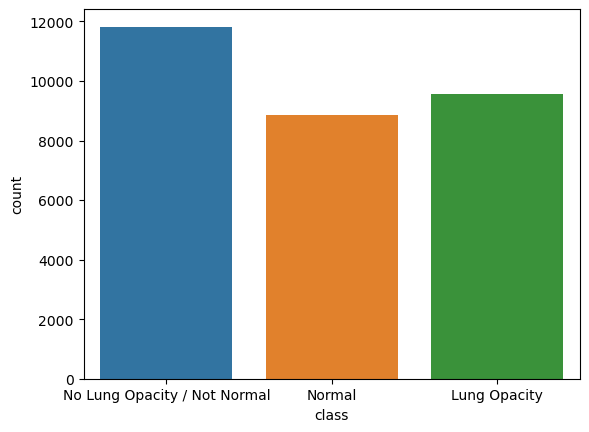

In [11]:
sns.countplot(x='class',data=classInfo);

# Images from different classes 1.Normal; 2.No Lung Opacity / Not Normal; 3.Lung Opacity

In [12]:
def get_feature_distribution(data, feature):
    # Get the count for each label
    label_counts = data[feature].value_counts()

    # Get total number of samples
    total_samples = len(data)

    # Count the number of items in each class
    print("Feature: {}".format(feature))
    for i in range(len(label_counts)):
        label = label_counts.index[i]
        count = label_counts.values[i]
        percent = int((count / total_samples) * 10000) / 100
        print("{:<30s}:   {} or {}%".format(label, count, percent))

get_feature_distribution(classInfo, 'class')

Feature: class
No Lung Opacity / Not Normal  :   11821 or 39.1%
Lung Opacity                  :   9555 or 31.61%
Normal                        :   8851 or 29.28%


In [13]:
classInfo[classInfo.duplicated()]

,patientId,class
5,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
9,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity
15,00aecb01-a116-45a2-956c-08d2fa55433f,Lung Opacity
17,00c0b293-48e7-4e16-ac76-9269ba535a62,Lung Opacity
20,00f08de1-517e-4652-a04f-d1dc9ee48593,Lung Opacity
...,...,...
30209,c18d1138-ba74-4af5-af21-bdd4d2c96bb5,Lung Opacity
30215,c1cddf32-b957-4753-acaa-472ab1447e86,Lung Opacity
30220,c1e73a4e-7afe-4ec5-8af6-ce8315d7a2f2,Lung Opacity
30222,c1ec14ff-f6d7-4b38-b0cb-fe07041cbdc8,Lung Opacity


# As we suspected there are 3543 duplicated records.

In [14]:
classInfo[classInfo.duplicated()].shape

(3543, 2)

In [15]:
classInfo[classInfo.patientId=='c1f7889a-9ea9-4acb-b64c-b737c929599a']

,patientId,class
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity
30226,c1f7889a-9ea9-4acb-b64c-b737c929599a,Lung Opacity


# **Check for missing values**

In [16]:
def missing_check(df):
    total = df.isnull().sum().sort_values(ascending=False)  # total number of null values
    percent = (df.isnull().sum() / df.isnull().count()).sort_values(
        ascending=False)  # percentage of values that are null
    missing_data = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])  # putting the above two together
    return missing_data  # return the dataframe

In [17]:
missing_check(classInfo)

,Total,Percent
patientId,0,0.0
class,0,0.0


**There are no missing values.**

# As we suspected there are 3543 duplicated records.

In [18]:
classInfo.shape

(30227, 2)

In [19]:
duplicateClassRowsDF = classInfo[classInfo.duplicated(['patientId'])]
duplicateClassRowsDF.shape

(3543, 2)

In [20]:
duplicateClassRowsDF.head(2)

,patientId,class
5,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity
9,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity


In [21]:
## The same patient id has the same class even though they are duplicate
classInfo[classInfo.patientId=='00704310-78a8-4b38-8475-49f4573b2dbb']

,patientId,class
8,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity
9,00704310-78a8-4b38-8475-49f4573b2dbb,Lung Opacity


# **Reading the trainlabels dataSet**

In [22]:
trainlabels = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_labels.csv')
trainlabels.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [23]:
trainlabels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB


In [24]:
trainlabels.shape

(30227, 6)

# The training labels consist of 30227 records, aligning with the metadata dataset of the same size

In [25]:
trainlabels.patientId.nunique()

26684

# The count of unique patient IDs also corresponds to the class information. Now, let's verify the class information for the same set of patients

In [26]:
trainlabels[trainlabels.patientId=='c1f7889a-9ea9-4acb-b64c-b737c929599a']

,patientId,x,y,width,height,Target
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1
30226,c1f7889a-9ea9-4acb-b64c-b737c929599a,233.0,424.0,201.0,356.0,1


# Two records exist for the same patient, each with different dimensions. This discrepancy might be attributed to the detection of X-ray opacity at multiple locations.

In [27]:
trainlabels[trainlabels.duplicated()]

,patientId,x,y,width,height,Target


# There are no duplicate records for train labels.

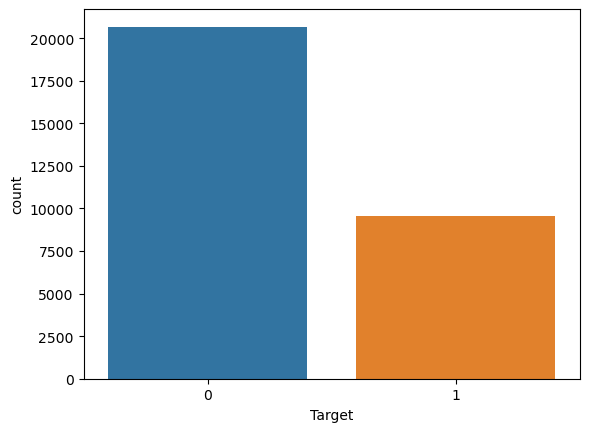

In [28]:
sns.countplot(x='Target',data=trainlabels);

# The "Target" column contains two values, namely 1 or 0. However, in the "ClassInfo," three distinct classes are observed. Let's delve deeper to explore the relationship between the "Target" and "Class" columns.

In [29]:
missing_check(trainlabels)

,Total,Percent
x,20672,0.683892
y,20672,0.683892
width,20672,0.683892
height,20672,0.683892
patientId,0,0.000000
Target,0,0.000000


In [30]:
trainlabels[trainlabels.x.isna()]

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
6,00569f44-917d-4c86-a842-81832af98c30,NaN,NaN,NaN,NaN,0
...,...,...,...,...,...,...
30216,c1cf3255-d734-4980-bfe0-967902ad7ed9,NaN,NaN,NaN,NaN,0
30217,c1e228e4-b7b4-432b-a735-36c48fdb806f,NaN,NaN,NaN,NaN,0
30218,c1e3eb82-c55a-471f-a57f-fe1a823469da,NaN,NaN,NaN,NaN,0
30223,c1edf42b-5958-47ff-a1e7-4f23d99583ba,NaN,NaN,NaN,NaN,0


# Some records lack X and Y values, potentially because these measurements may not be applicable for normal patients

In [31]:
trainlabels[trainlabels.x.isna()]['Target'].unique()

array([0], dtype=int64)

# Its proved that only for normal patients dimensions are not available.

In [32]:
trainlabels.describe()

,x,y,width,height,Target
count,9555.000000,9555.000000,9555.000000,9555.000000,30227.000000
mean,394.047724,366.839560,218.471376,329.269702,0.316108
std,204.574172,148.940488,59.289475,157.750755,0.464963
min,2.000000,2.000000,40.000000,45.000000,0.000000
25%,207.000000,249.000000,177.000000,203.000000,0.000000
50%,324.000000,365.000000,217.000000,298.000000,0.000000
75%,594.000000,478.500000,259.000000,438.000000,1.000000
max,835.000000,881.000000,528.000000,942.000000,1.000000


# 75% of the data represents target value 1. Count plot also shows the same. So looks its an imbalanced data set.

# Lets concatenate classInfo and trainlabels . Before concatinating them lets remove duplicate records from class info.

In [33]:
trainlabels.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 6 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   patientId  30227 non-null  object 
 1   x          9555 non-null   float64
 2   y          9555 non-null   float64
 3   width      9555 non-null   float64
 4   height     9555 non-null   float64
 5   Target     30227 non-null  int64  
dtypes: float64(4), int64(1), object(1)
memory usage: 1.4+ MB


In [34]:
classInfo.drop_duplicates(inplace=True)

In [35]:
classInfo.shape

(26684, 2)

In [36]:
## we can see that all the null column values are with Target 0 indicating that those patients do not have penumonia
trainlabels[trainlabels.isnull().any(axis=1)].Target.value_counts()

Target
0    20672
Name: count, dtype: int64

In [37]:
## we can see that all the non null column values are with Target 1 indicating that those patients have pneumonia
trainlabels[~trainlabels.isnull().any(axis=1)].Target.value_counts()

Target
1    9555
Name: count, dtype: int64

In [38]:
## Distubution of Targets , there are 20672 records with no pneumonia and 9555 with pneumonia
trainlabels.Target.value_counts()

Target
0    20672
1     9555
Name: count, dtype: int64

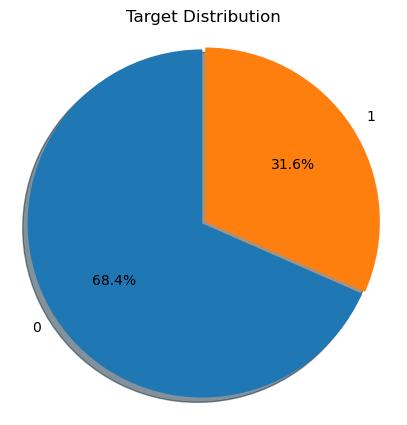

In [39]:
## The distribution of the target variable shows that 31% of patients in the dataset have pneumonia,
## while the rest do not. This indicates a class imbalance issue within the dataset.
label_count=trainlabels['Target'].value_counts()
explode = (0.01,0.01)

fig1, ax1 = plt.subplots(figsize=(5,5))
ax1.pie(label_count.values, explode=explode, labels=label_count.index, autopct='%1.1f%%',
        shadow=True, startangle=90)
ax1.axis('equal')
plt.title('Target Distribution')
plt.show()

In [40]:
print("Are there Unique Patients In Data Set ?? " ,trainlabels['patientId'].is_unique)

Are there Unique Patients In Data Set ??  False


In [41]:
duplicateRowsDF = trainlabels[trainlabels.duplicated(['patientId'])]
duplicateRowsDF.shape

(3543, 6)

In [42]:
duplicateRowsDF.head(2)

,patientId,x,y,width,height,Target
5,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1
9,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1


In [43]:
## Examining one of the patient id which is duplicate , we can see that the x,y, widht and height is not the same
## This indicates that the same patient has two bounding boxes in the same dicom image
trainlabels[trainlabels.patientId=='00436515-870c-4b36-a041-de91049b9ab4']

,patientId,x,y,width,height,Target
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1
5,00436515-870c-4b36-a041-de91049b9ab4,562.0,152.0,256.0,453.0,1


In [44]:
trainlabels[trainlabels.patientId=='00704310-78a8-4b38-8475-49f4573b2dbb']

,patientId,x,y,width,height,Target
8,00704310-78a8-4b38-8475-49f4573b2dbb,323.0,577.0,160.0,104.0,1
9,00704310-78a8-4b38-8475-49f4573b2dbb,695.0,575.0,162.0,137.0,1


# **Step 2: Map training and testing images to its classes.**

In [45]:
traindf = trainlabels.merge(classInfo, left_on='patientId', right_on='patientId', how='inner')

In [46]:
traindf.head()

,patientId,x,y,width,height,Target,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity


# Lets check for specific patient how data has been concatinated.

In [47]:
traindf[traindf.patientId=='c1f7889a-9ea9-4acb-b64c-b737c929599a']

,patientId,x,y,width,height,Target,class
30225,c1f7889a-9ea9-4acb-b64c-b737c929599a,570.0,393.0,261.0,345.0,1,Lung Opacity
30226,c1f7889a-9ea9-4acb-b64c-b737c929599a,233.0,424.0,201.0,356.0,1,Lung Opacity


# Good, same patient has different dimension values with same target value.
# Now lets see how class and target are related to each other??


In [48]:
traindf.Target.unique()

array([0, 1], dtype=int64)

In [49]:
traindf.groupby(['class', 'Target']).size().reset_index(name='Patient Count')

,class,Target,Patient Count
0,Lung Opacity,1,9555
1,No Lung Opacity / Not Normal,0,11821
2,Normal,0,8851


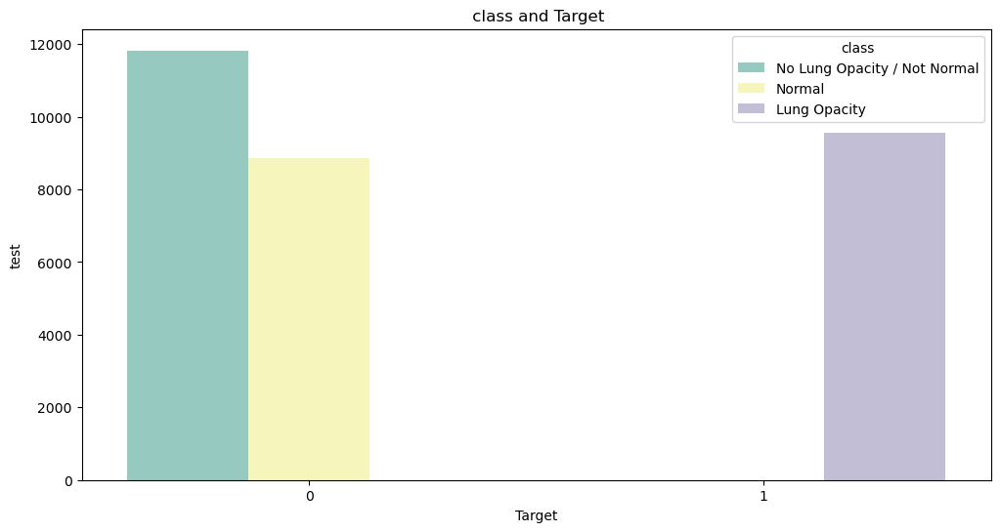

In [50]:
fig, ax = plt.subplots(nrows=1,figsize=(12,6))
tmp = traindf.groupby('Target')['class'].value_counts()
df = pd.DataFrame(data={'test': tmp.values}, index=tmp.index).reset_index()
sns.barplot(ax=ax,x = 'Target', y='test',hue='class',data=df, palette='Set3')
plt.title(" class and Target")
plt.show()

# classifying "Normal" and "No Lung Opacity / Not Normal" into a single target value '0'. Therefore, we can conclude that the prediction task is a binary classification, determining whether a patient has lung opacity or not. The classes "Normal" and "Not Normal" have been merged into the same target category.

# Prediction: Binary classification i.e. Patient has Lung Opacity or not?

<Axes: >

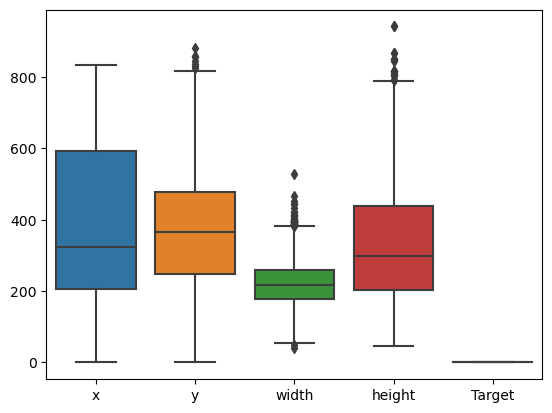

In [51]:
sns.boxplot(data=traindf)

In [52]:
# Identify non-numeric columns and exclude them
numeric_columns = traindf.select_dtypes(include=['number']).columns
numeric_traindf = traindf[numeric_columns]

# Calculate the correlation matrix
correlation_matrix = numeric_traindf.corr()

# Display the correlation matrix
print(correlation_matrix)

               x         y     width    height  Target
x       1.000000  0.007604 -0.058665  0.008256     NaN
y       0.007604  1.000000 -0.299897 -0.645369     NaN
width  -0.058665 -0.299897  1.000000  0.597461     NaN
height  0.008256 -0.645369  0.597461  1.000000     NaN
Target       NaN       NaN       NaN       NaN     1.0


<Figure size 640x480 with 0 Axes>

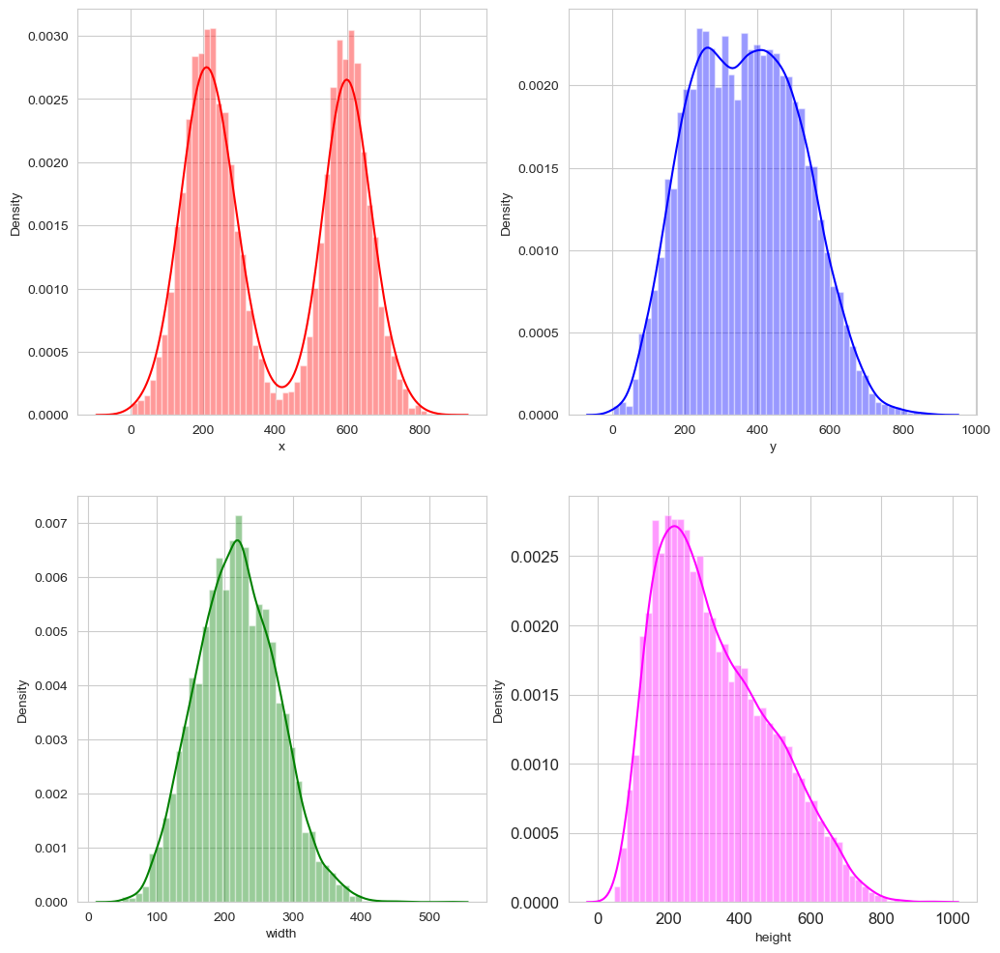

In [53]:
target1 = traindf[traindf['Target']==1]
sns.set_style('whitegrid')
plt.figure()
fig, ax = plt.subplots(2,2,figsize=(12,12))
sns.distplot(target1['x'],kde=True,bins=50, color="red", ax=ax[0,0]);
sns.distplot(target1['y'],kde=True,bins=50, color="blue", ax=ax[0,1]);
sns.distplot(target1['width'],kde=True,bins=50, color="green", ax=ax[1,0]);
sns.distplot(target1['height'],kde=True,bins=50, color="magenta", ax=ax[1,1]);
locs, labels = plt.xticks()
plt.tick_params(axis='both', which='major', labelsize=12)
plt.show()

In [54]:
trainImagesPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images')
testImagesPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_test_images')

In [55]:
import os;
image_train_path = os.listdir(trainImagesPath)
image_test_path = os.listdir(testImagesPath)

print("Number of images in train set:", len(image_train_path),"\nNumber of images in test set:", len(image_test_path))

Number of images in train set: 26684 
Number of images in test set: 3000


# Train images length matched with unique patient id's in traindf.

# **Step 3: Map training and testing images to its annotations.**

In [56]:
samplePatientID = list(traindf[:3].T.to_dict().values())[0]['patientId']
dcm_path = trainImagesPath/samplePatientID
dcm_path = dcm_path.with_suffix(".dcm")
dcm = pydicom.read_file(dcm_path)
dcm

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 202
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.28530.1517874485.775526
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time      

# **‣ Step 4: Preprocessing and Visualisation of different classes**

# We can observe that within the DICOM metadata, there is valuable information with predictive value. For instance:
## Patient sex;
## Patient age;
## Modality;
## Body part examined;
## View position;
## Rows & Columns;
## Pixel Spacing.



In [57]:
def show_dicom_images(data):
    img_data = list(data.T.to_dict().values())
    f, ax = plt.subplots(3,3, figsize=(16,18))
    for i,data_row in enumerate(img_data):
        dcm_path = trainImagesPath/data_row['patientId']
        dcm_path = dcm_path.with_suffix(".dcm")
        data_row_img_data = pydicom.read_file(dcm_path)
        modality = data_row_img_data.Modality
        age = data_row_img_data.PatientAge
        sex = data_row_img_data.PatientSex
        ax[i//3, i%3].imshow(data_row_img_data.pixel_array, cmap=plt.cm.bone)
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title('ID: {}\nModality: {} Age: {} Sex: {} Target: {}\nClass: {}\nWindow: {}:{}:{}:{}'.format(
                data_row['patientId'],
                modality, age, sex, data_row['Target'], data_row['class'],
                data_row['x'],data_row['y'],data_row['width'],data_row['height']))
    plt.show()

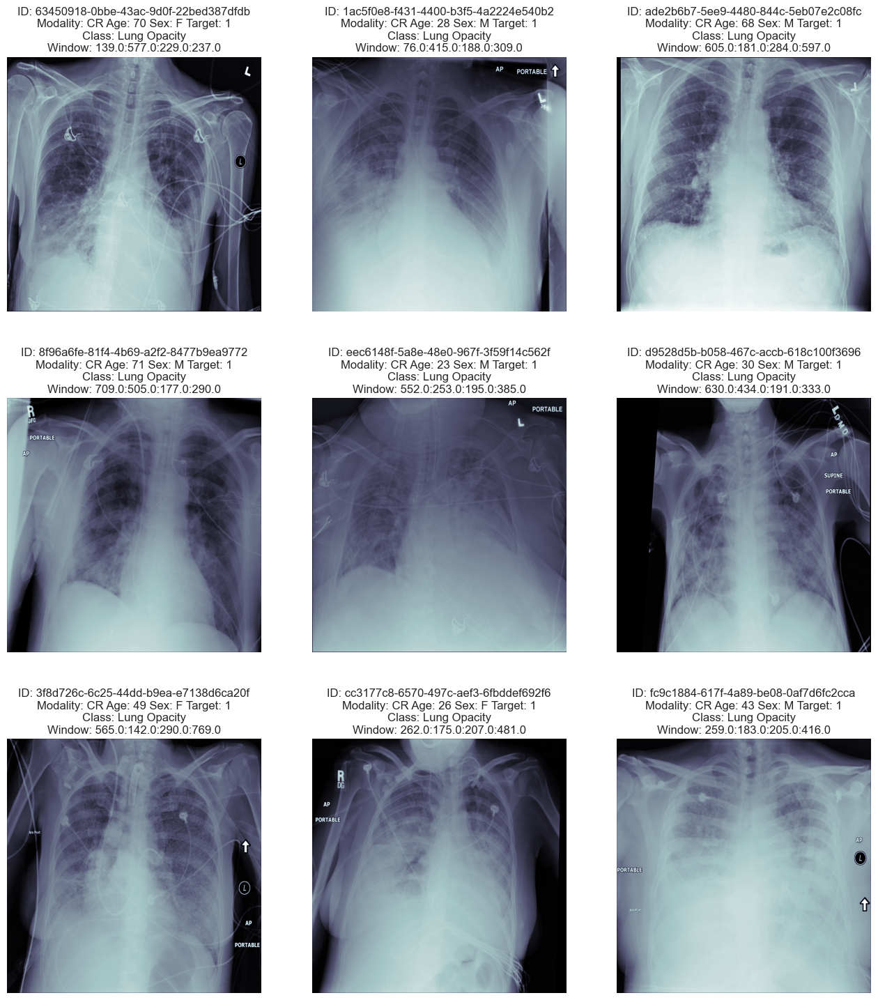

In [58]:
show_dicom_images(traindf[traindf['Target']==1].sample(9))

# To visualize the images with overlay boxes superimposed, our initial step involves parsing the entire dataset where the target is equal to 1. Subsequently, we will gather all the coordinates of windows displaying lung opacity on the same image.

# **‣ Step 5: Display images with bounding box.**

In [59]:
def show_dicom_images_with_boxes(data):
    img_data = list(data.T.to_dict().values())
    f, ax = plt.subplots(3,3, figsize=(16,18))
    for i,data_row in enumerate(img_data):
        dcm_path = trainImagesPath/data_row['patientId']
        dcm_path = dcm_path.with_suffix(".dcm")
        data_row_img_data = pydicom.read_file(dcm_path)
        modality = data_row_img_data.Modality
        age = data_row_img_data.PatientAge
        sex = data_row_img_data.PatientSex
        ax[i//3, i%3].imshow(data_row_img_data.pixel_array, cmap=plt.cm.bone)
        ax[i//3, i%3].axis('off')
        ax[i//3, i%3].set_title('ID: {}\nModality: {} Age: {} Sex: {} Target: {}\nClass: {}'.format(
                data_row['patientId'],modality, age, sex, data_row['Target'], data_row['class']))
        rows = traindf[traindf['patientId']==data_row['patientId']]
        box_data = list(rows.T.to_dict().values())
        for j, row in enumerate(box_data):
            ax[i//3, i%3].add_patch(Rectangle(xy=(row['x'], row['y']),
                        width=row['width'],height=row['height'],
                       linewidth=2, edgecolor='r', facecolor='none'))
    plt.show()

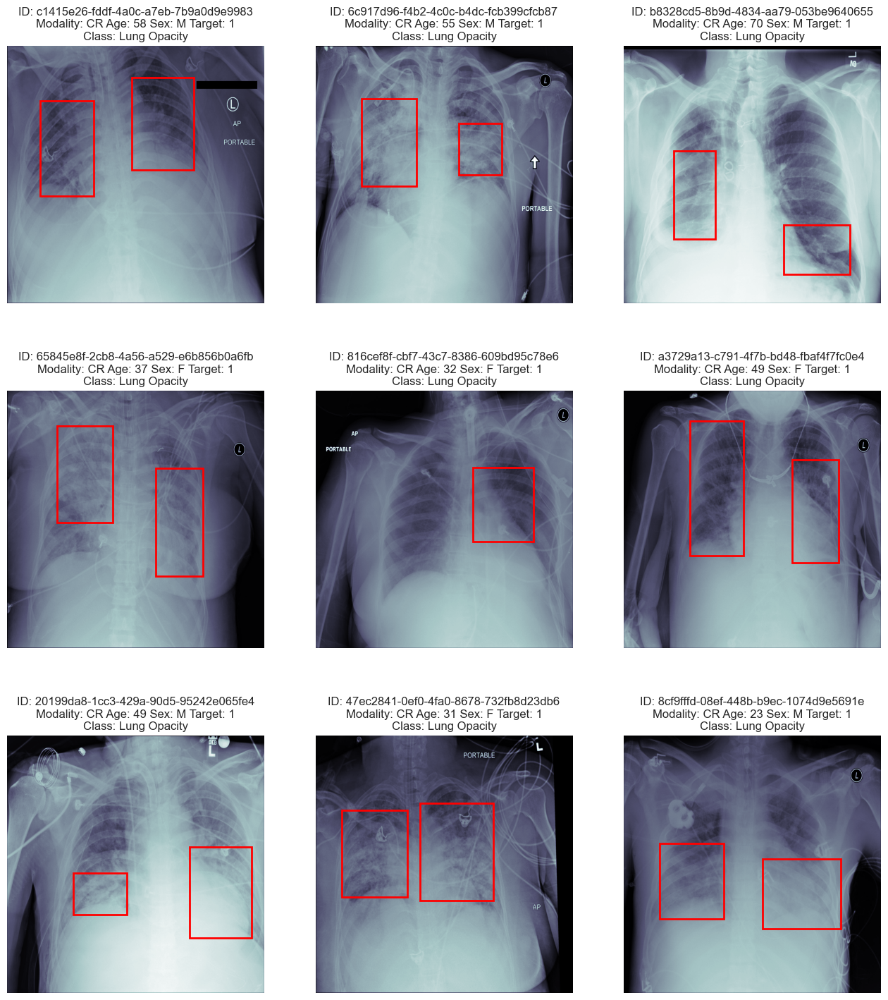

In [60]:
show_dicom_images_with_boxes(traindf[traindf['Target']==1].sample(9))

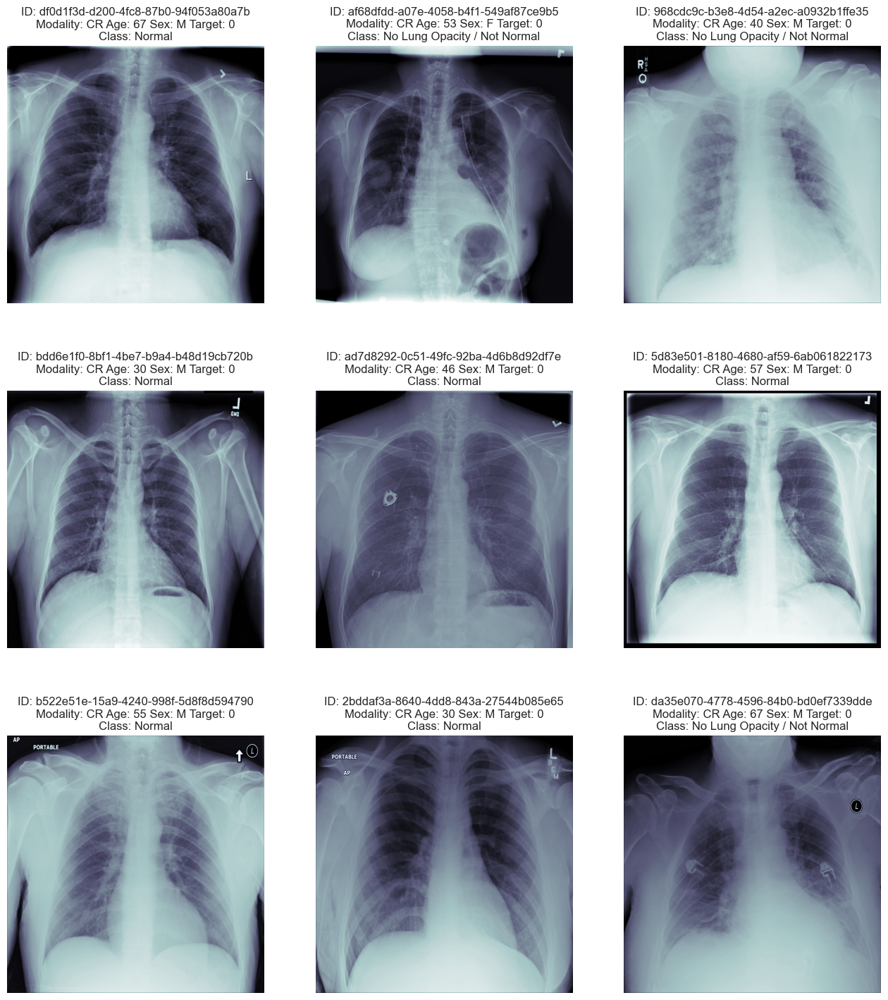

In [61]:
show_dicom_images_with_boxes(traindf[traindf['Target']==0].sample(9))

In [62]:
from tqdm.notebook import tqdm

In [63]:
vars = ['Modality', 'PatientAge', 'PatientSex', 'BodyPartExamined', 'ViewPosition', 'ConversionType', 'Rows', 'Columns', 'PixelSpacing']

def process_dicom_data(data_df,imagesPath):
    for var in vars:
        data_df[var] = None
    image_names = os.listdir(imagesPath)
    for i, img_name in tqdm_notebook(enumerate(image_names)):

        dcm_path = imagesPath/img_name
        dcm_path = dcm_path.with_suffix(".dcm")
        data_row_img_data = pydicom.read_file(dcm_path)
        idx = (data_df['patientId']==data_row_img_data.PatientID)
        data_df.loc[idx,'Modality'] = data_row_img_data.Modality
        data_df.loc[idx,'PatientAge'] = pd.to_numeric(data_row_img_data.PatientAge)
        data_df.loc[idx,'PatientSex'] = data_row_img_data.PatientSex
        data_df.loc[idx,'BodyPartExamined'] = data_row_img_data.BodyPartExamined
        data_df.loc[idx,'ViewPosition'] = data_row_img_data.ViewPosition
        data_df.loc[idx,'ConversionType'] = data_row_img_data.ConversionType
        data_df.loc[idx,'Rows'] = data_row_img_data.Rows
        data_df.loc[idx,'Columns'] = data_row_img_data.Columns
        data_df.loc[idx,'PixelSpacing'] = str.format("{:4.3f}",data_row_img_data.PixelSpacing[0])


In [64]:
process_dicom_data(traindf,trainImagesPath)

C:\Users\manve\AppData\Local\Temp\ipykernel_22560\558203940.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, img_name in tqdm_notebook(enumerate(image_names)):


0it [00:00, ?it/s]

In [65]:
traindf.head()

,patientId,x,y,width,height,Target,class,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,CR,51,F,CHEST,PA,WSD,1024,1024,0.143
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,CR,48,F,CHEST,PA,WSD,1024,1024,0.194
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,CR,19,M,CHEST,AP,WSD,1024,1024,0.168
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0,Normal,CR,28,M,CHEST,PA,WSD,1024,1024,0.143
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1,Lung Opacity,CR,32,F,CHEST,AP,WSD,1024,1024,0.139


In [66]:
testdf = pd.read_csv(sampleSubPath)

In [67]:
testdf = testdf.drop('PredictionString', axis=1)
process_dicom_data(testdf,testImagesPath)

C:\Users\manve\AppData\Local\Temp\ipykernel_22560\558203940.py:7: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for i, img_name in tqdm_notebook(enumerate(image_names)):


0it [00:00, ?it/s]

In [68]:
testdf.head()

,patientId,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
0,0000a175-0e68-4ca4-b1af-167204a7e0bc,CR,46,F,CHEST,PA,WSD,1024,1024,0.194
1,0005d3cc-3c3f-40b9-93c3-46231c3eb813,CR,22,F,CHEST,PA,WSD,1024,1024,0.143
2,000686d7-f4fc-448d-97a0-44fa9c5d3aa6,CR,64,M,CHEST,PA,WSD,1024,1024,0.143
3,000e3a7d-c0ca-4349-bb26-5af2d8993c3d,CR,75,F,CHEST,PA,WSD,1024,1024,0.143
4,00100a24-854d-423d-a092-edcf6179e061,CR,66,F,CHEST,AP,WSD,1024,1024,0.139


**Modality**

In [69]:
traindf.Modality.unique()

array(['CR'], dtype=object)

In [70]:
testdf.Modality.unique()

array(['CR'], dtype=object)

**The meaning of this modality is CR - Computer Radiography**

**Patient Age**

In [71]:
traindf['PatientAge'].value_counts()

PatientAge
58     955
56     869
52     791
55     767
54     717
      ... 
148      1
151      1
153      1
150      1
155      1
Name: count, Length: 97, dtype: int64

In [72]:
traindf['PatientAge'].max()

155

In [73]:
traindf['PatientAge'].min()

1

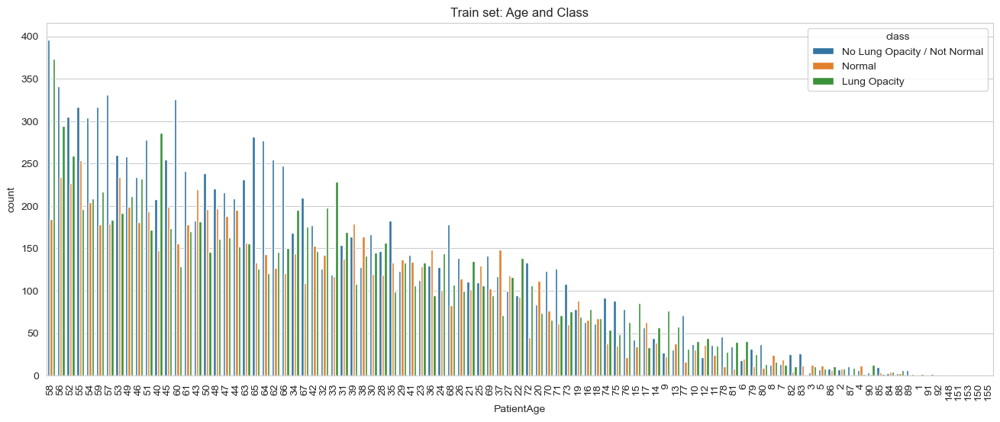

In [74]:
fig, (ax) = plt.subplots(nrows=1,figsize=(16,6))
sns.countplot(ax=ax, x = 'PatientAge',hue='class',data=traindf, order = traindf['PatientAge'].value_counts().index)
plt.title("Train set: Age and Class")
plt.xticks(rotation=90)
plt.show()

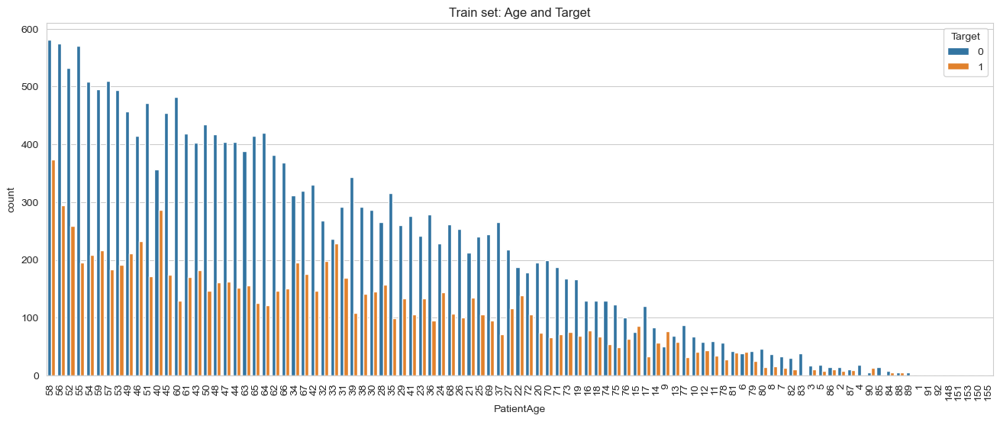

In [75]:
fig, (ax) = plt.subplots(nrows=1,figsize=(16,6))
sns.countplot(ax=ax, x = 'PatientAge',hue='Target',data=traindf, order = traindf['PatientAge'].value_counts().index)
plt.title("Train set: Age and Target")
plt.xticks(rotation=90)
plt.show()

The majority of the data is recorded for individuals aged between 40 to 50. However, an outlier is present with an age of 151. There are limited data points for age groups between 1 to 5 and 80 to 90.

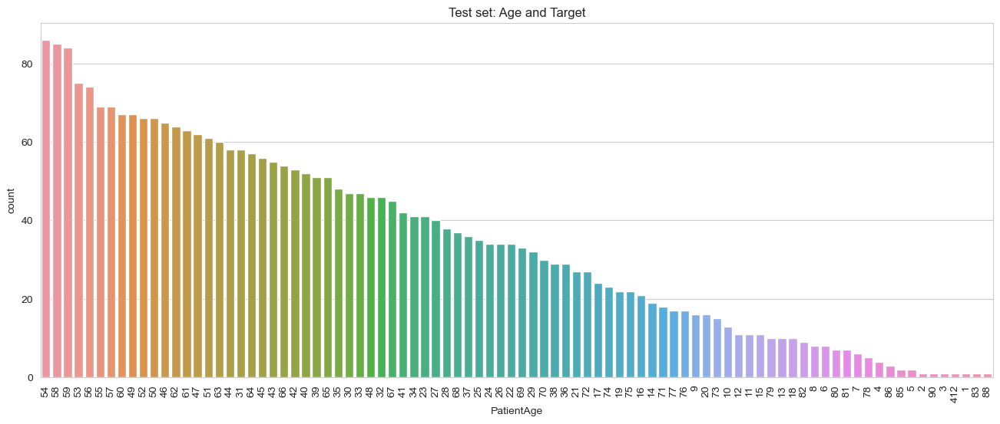

In [76]:
fig, (ax) = plt.subplots(nrows=1,figsize=(16,6))
sns.countplot(ax=ax, x = 'PatientAge',data=testdf, order = testdf['PatientAge'].value_counts().index)
plt.title("Test set: Age and Target")
plt.xticks(rotation=90)
plt.show()

**In test set also similar kind of behaviour observed in data among different age groups. Outlier with Age 412**

**PatientSex**

In [77]:
traindf['PatientSex'].value_counts()

PatientSex
M    17216
F    13011
Name: count, dtype: int64

In [78]:
testdf['PatientSex'].value_counts()

PatientSex
M    1714
F    1286
Name: count, dtype: int64

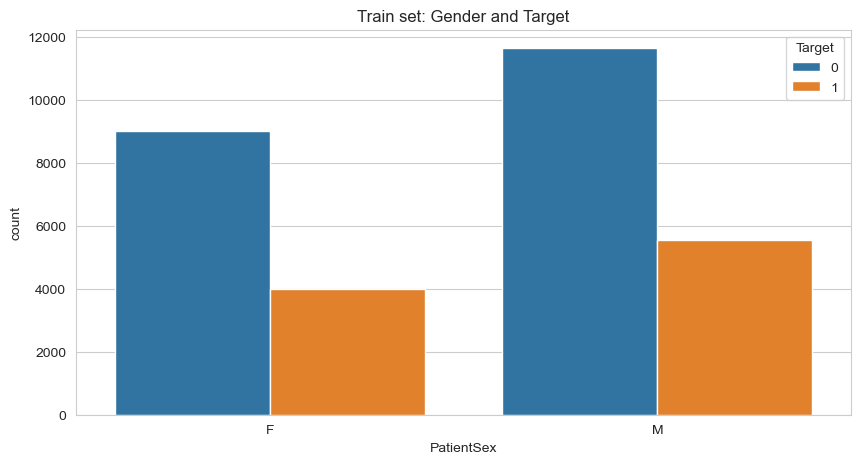

In [79]:
fig, (ax) = plt.subplots(nrows=1,figsize=(10,5))
sns.countplot(ax=ax, x = 'PatientSex',hue='Target',data=traindf)
plt.title("Train set: Gender and Target")
plt.show()

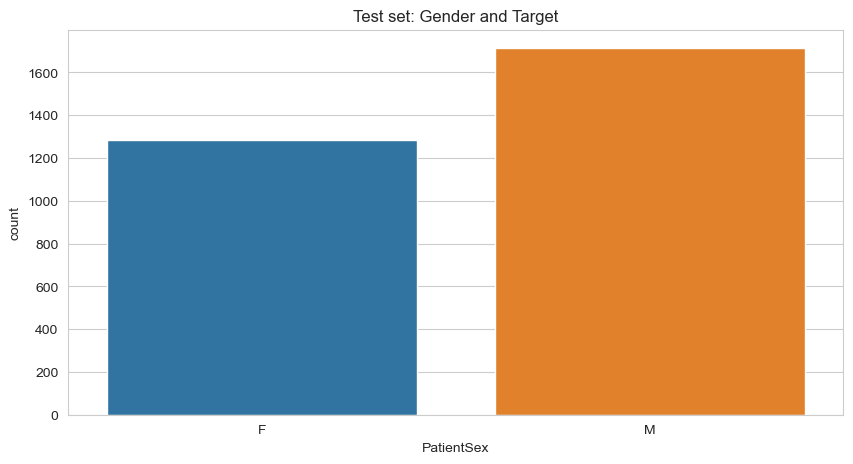

In [80]:
fig, (ax) = plt.subplots(nrows=1,figsize=(10,5))
sns.countplot(ax=ax, x = 'PatientSex',data=testdf)
plt.title("Test set: Gender and Target")
plt.show()

**BodyPartExamined**

In [81]:
traindf['BodyPartExamined'].value_counts()

BodyPartExamined
CHEST    30227
Name: count, dtype: int64

In [82]:
testdf['BodyPartExamined'].value_counts()

BodyPartExamined
CHEST    3000
Name: count, dtype: int64

**Unique values found for this column**

**ConversionType**

In [83]:
traindf['ConversionType'].value_counts()

ConversionType
WSD    30227
Name: count, dtype: int64

In [84]:
testdf['ConversionType'].value_counts()

ConversionType
WSD    3000
Name: count, dtype: int64

**Unique values found for this column**

**Rows Columns**

In [85]:
traindf['Rows'].value_counts()

Rows
1024    30227
Name: count, dtype: int64

In [86]:
traindf['Columns'].value_counts()

Columns
1024    30227
Name: count, dtype: int64

In [87]:
testdf['Rows'].value_counts(),testdf['Columns'].value_counts()

(Rows
 1024    3000
 Name: count, dtype: int64,
 Columns
 1024    3000
 Name: count, dtype: int64)

**Unique values found.**

**ViewPosition**

In [88]:
traindf['ViewPosition'].value_counts()

ViewPosition
AP    15297
PA    14930
Name: count, dtype: int64

<Axes: xlabel='ViewPosition', ylabel='count'>

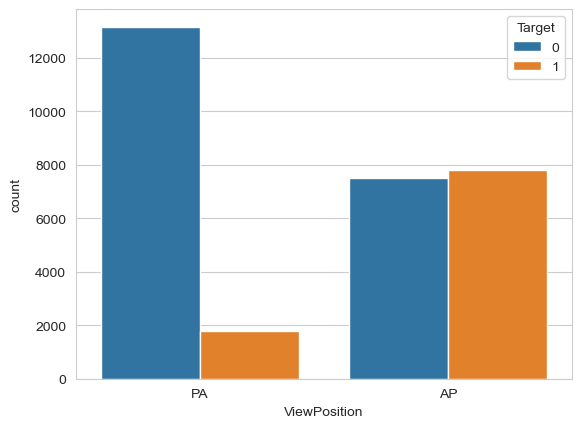

In [89]:
sns.countplot(x='ViewPosition',hue='Target',data=traindf)

<Axes: xlabel='ViewPosition', ylabel='count'>

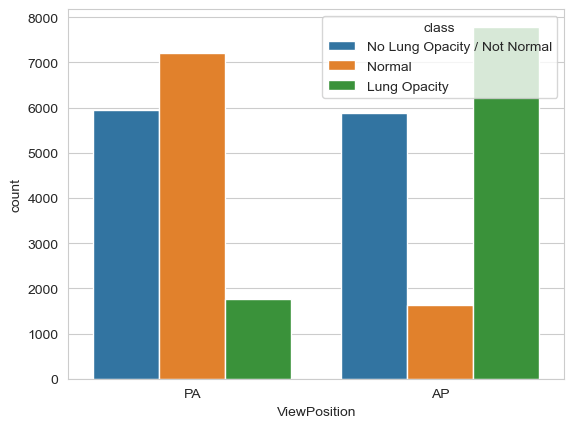

In [90]:
sns.countplot(x='ViewPosition',hue='class',data=traindf)

In [91]:
from sklearn import preprocessing

label_encoder = preprocessing.LabelEncoder()

traindf['ViewPosition']= label_encoder.fit_transform(traindf['ViewPosition'])
print(label_encoder.classes_)
traindf['ViewPosition'].unique()

['AP' 'PA']


array([1, 0])

<Axes: xlabel='ViewPosition', ylabel='count'>

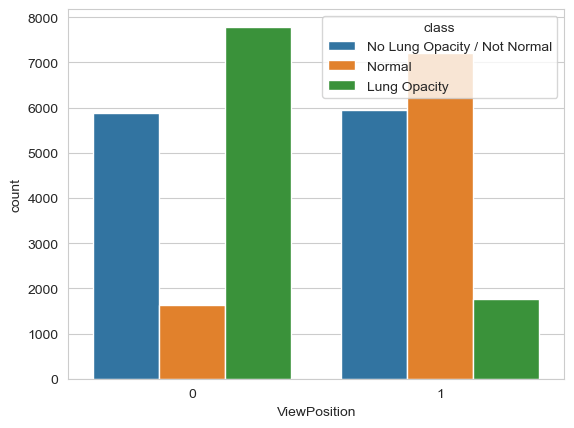

In [92]:
sns.countplot(x='ViewPosition',hue='class',data=traindf)

# **AP-AnteriorPosterior=0,  PA-PostereiorAterior=1**

In [93]:
testdf['ViewPosition'].value_counts()

ViewPosition
PA    1618
AP    1382
Name: count, dtype: int64

In [94]:
# label_encoder object knows how to understand word labels.
label_encoder = preprocessing.LabelEncoder()

testdf['ViewPosition']= label_encoder.fit_transform(testdf['ViewPosition'])
print(label_encoder.classes_)
testdf['ViewPosition'].unique()

['AP' 'PA']


array([1, 0])

**PixelSpacing**

In [95]:
traindf['PixelSpacing'].value_counts()

PixelSpacing
0.168    10677
0.143     9221
0.139     6585
0.171     2351
0.194     1380
0.115        8
0.199        5
Name: count, dtype: int64

<Axes: xlabel='PixelSpacing', ylabel='count'>

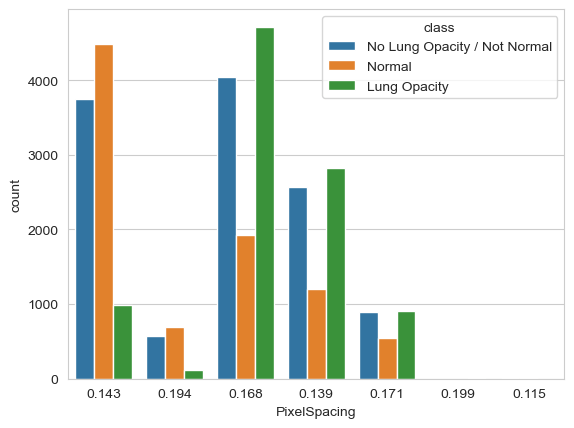

In [96]:
sns.countplot(x='PixelSpacing',hue='class',data=traindf)

<Axes: xlabel='PixelSpacing', ylabel='count'>

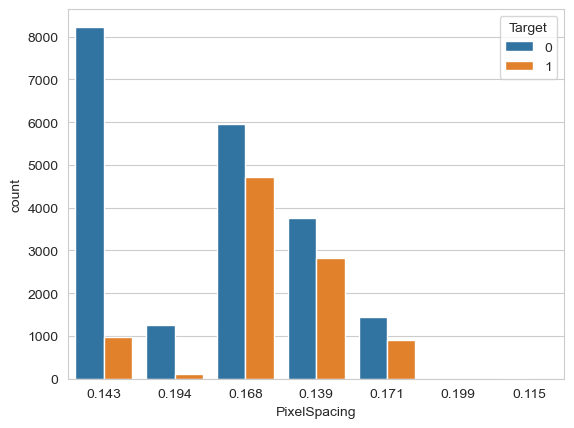

In [97]:
sns.countplot(x='PixelSpacing',hue='Target',data=traindf)

**0.115 Pixel spacing for age between 2-11 years. and 0.199 is from 20-35 age group. we have very less data points for this.**

In [98]:
traindf[traindf['PixelSpacing']=='0.199']

,patientId,x,y,width,height,Target,class,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
673,09714ab6-5dce-4ded-94cc-f79a47b4b171,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,CR,25,M,CHEST,0,WSD,1024,1024,0.199
16521,9fae656b-cf66-4c4b-a5ed-1962ebcafb7d,651.0,346.0,275.0,210.0,1,Lung Opacity,CR,38,M,CHEST,0,WSD,1024,1024,0.199
16522,9fae656b-cf66-4c4b-a5ed-1962ebcafb7d,262.0,354.0,240.0,156.0,1,Lung Opacity,CR,38,M,CHEST,0,WSD,1024,1024,0.199
20838,bda68f49-6eb2-4afa-86bf-89a3d4378100,634.0,436.0,217.0,167.0,1,Lung Opacity,CR,23,F,CHEST,0,WSD,1024,1024,0.199
20839,bda68f49-6eb2-4afa-86bf-89a3d4378100,389.0,395.0,142.0,181.0,1,Lung Opacity,CR,23,F,CHEST,0,WSD,1024,1024,0.199


In [99]:
traindf[traindf['PixelSpacing']=='0.115']

,patientId,x,y,width,height,Target,class,Modality,PatientAge,PatientSex,BodyPartExamined,ViewPosition,ConversionType,Rows,Columns,PixelSpacing
9834,6a8a2a9b-b22e-471a-8b90-3c5f6496cee6,NaN,NaN,NaN,NaN,0,Normal,CR,6,M,CHEST,1,WSD,1024,1024,0.115
15480,9746c15f-94d1-4528-aff0-8ef02ccccef0,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,CR,2,F,CHEST,0,WSD,1024,1024,0.115
17741,a8f16478-b36a-4bc9-ac8a-75477d8ea168,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,CR,5,F,CHEST,1,WSD,1024,1024,0.115
21089,bf494059-4fe2-4f8f-a503-c340105e56ce,NaN,NaN,NaN,NaN,0,Normal,CR,4,M,CHEST,1,WSD,1024,1024,0.115
22215,c908770d-5bb8-479e-9112-ff9c47d07277,NaN,NaN,NaN,NaN,0,No Lung Opacity / Not Normal,CR,11,F,CHEST,0,WSD,1024,1024,0.115
24190,d9728525-2c4b-4526-bbf7-873831872a20,227.0,474.0,250.0,200.0,1,Lung Opacity,CR,7,F,CHEST,0,WSD,1024,1024,0.115
26339,eb2225b3-b09e-408c-8c48-27b1bad103a9,265.0,643.0,125.0,102.0,1,Lung Opacity,CR,4,M,CHEST,0,WSD,1024,1024,0.115
28660,fd6f8775-392d-4f85-bc25-398c02a30678,NaN,NaN,NaN,NaN,0,Normal,CR,7,M,CHEST,0,WSD,1024,1024,0.115


In [100]:
traindf=traindf.drop(['Modality','ConversionType','BodyPartExamined','Rows','Columns'],axis=1);

In [101]:
testdf=testdf.drop(['Modality','ConversionType','BodyPartExamined','Rows','Columns'],axis=1);

In [102]:
traindf.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30227 entries, 0 to 30226
Data columns (total 11 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   patientId     30227 non-null  object 
 1   x             9555 non-null   float64
 2   y             9555 non-null   float64
 3   width         9555 non-null   float64
 4   height        9555 non-null   float64
 5   Target        30227 non-null  int64  
 6   class         30227 non-null  object 
 7   PatientAge    30227 non-null  object 
 8   PatientSex    30227 non-null  object 
 9   ViewPosition  30227 non-null  int32  
 10  PixelSpacing  30227 non-null  object 
dtypes: float64(4), int32(1), int64(1), object(5)
memory usage: 2.4+ MB


In [103]:
traindf[traindf['PatientAge'].isna()]

,patientId,x,y,width,height,Target,class,PatientAge,PatientSex,ViewPosition,PixelSpacing


In [104]:
# Identify non-numeric columns and exclude them
numeric_columns = traindf.select_dtypes(include=['number']).columns
numeric_traindf = traindf[numeric_columns]

# Calculate the correlation matrix
correlation_matrix = numeric_traindf.corr()

# Display the correlation matrix
print(correlation_matrix)

                     x         y     width    height    Target  ViewPosition
x             1.000000  0.007604 -0.058665  0.008256       NaN     -0.022248
y             0.007604  1.000000 -0.299897 -0.645369       NaN      0.124721
width        -0.058665 -0.299897  1.000000  0.597461       NaN     -0.087427
height        0.008256 -0.645369  0.597461  1.000000       NaN     -0.275490
Target             NaN       NaN       NaN       NaN  1.000000     -0.420189
ViewPosition -0.022248  0.124721 -0.087427 -0.275490 -0.420189      1.000000


# **‣ Step 6: Design, train and test basic CNN models for classification.**

In [105]:
classInfo = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_detailed_class_info.csv')
trainlabels = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_labels.csv')
trainImagesPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images')

In [106]:
#let's see how many image we have in trainImagesPath
num_dicom = os.listdir(trainImagesPath)
print(len(num_dicom))

26684


In [107]:
print(classInfo.shape, trainlabels.shape)

(30227, 2) (30227, 6)


In [108]:
classInfo.head()

,patientId,class
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity


In [109]:
trainlabels.head()

,patientId,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,264.0,152.0,213.0,379.0,1


In [110]:
pneumonia = pd.merge(classInfo, trainlabels, on='patientId', how='inner')

In [111]:
print(pneumonia.shape)

(37629, 7)


In [112]:
pneumonia.head()

,patientId,class,x,y,width,height,Target
0,0004cfab-14fd-4e49-80ba-63a80b6bddd6,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
1,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
2,00322d4d-1c29-4943-afc9-b6754be640eb,No Lung Opacity / Not Normal,NaN,NaN,NaN,NaN,0
3,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,Normal,NaN,NaN,NaN,NaN,0
4,00436515-870c-4b36-a041-de91049b9ab4,Lung Opacity,264.0,152.0,213.0,379.0,1


In [113]:
len(pneumonia['patientId'])

37629

In [114]:
37629-30227

7402

**Because the patientId column is duplicated after merging detail_class and bbox_info, we must drop paitientId from detail_class.**

In [115]:
pneumonia = pd.concat([classInfo.drop(columns = 'patientId'), trainlabels], axis = 1)

In [116]:
#Here we go
pneumonia.shape

(30227, 7)

In [117]:
pneumonia['patientId'].nunique()

26684

In [118]:
# Add all Bound In Box parameters in 'bbox'
pneumonia['bbox'] = pneumonia[['x', 'y', 'height', 'width']].apply(lambda x: '-'.join(str(i) for i in x), axis=1)

In [119]:
pneumonia = pneumonia.drop(columns = ['x', 'y', 'height', 'width'])

In [120]:
pneumonia.head()

,class,patientId,Target,bbox
0,No Lung Opacity / Not Normal,0004cfab-14fd-4e49-80ba-63a80b6bddd6,0,nan-nan-nan-nan
1,No Lung Opacity / Not Normal,00313ee0-9eaa-42f4-b0ab-c148ed3241cd,0,nan-nan-nan-nan
2,No Lung Opacity / Not Normal,00322d4d-1c29-4943-afc9-b6754be640eb,0,nan-nan-nan-nan
3,Normal,003d8fa0-6bf1-40ed-b54c-ac657f8495c5,0,nan-nan-nan-nan
4,Lung Opacity,00436515-870c-4b36-a041-de91049b9ab4,1,264.0-152.0-379.0-213.0


In [121]:
path = r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images\*.dcm'

images = os.listdir(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images')

pneumonia['image_path'] = ''

for i in range(len(pneumonia)):
    patient_id = pneumonia['patientId'][i]
    image_path = os.path.join(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images', patient_id + '.dcm')
    pneumonia['image_path'][i] = image_path

C:\Users\manve\AppData\Local\Temp\ipykernel_22560\802141537.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pneumonia['image_path'][i] = image_path
C:\Users\manve\AppData\Local\Temp\ipykernel_22560\802141537.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pneumonia['image_path'][i] = image_path
C:\Users\manve\AppData\Local\Temp\ipykernel_22560\802141537.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  pneumonia['image_pat

In [122]:
#look at the meta data of random image from train set
random_patient_id = pneumonia['patientId'].sample().values[0]
dicom_data = pydicom.read_file(image_path)


print(dicom_data)

Dataset.file_meta -------------------------------
(0002, 0000) File Meta Information Group Length  UL: 200
(0002, 0001) File Meta Information Version       OB: b'\x00\x01'
(0002, 0002) Media Storage SOP Class UID         UI: Secondary Capture Image Storage
(0002, 0003) Media Storage SOP Instance UID      UI: 1.2.276.0.7230010.3.1.4.8323329.9955.1517874345.895762
(0002, 0010) Transfer Syntax UID                 UI: JPEG Baseline (Process 1)
(0002, 0012) Implementation Class UID            UI: 1.2.276.0.7230010.3.0.3.6.0
(0002, 0013) Implementation Version Name         SH: 'OFFIS_DCMTK_360'
-------------------------------------------------
(0008, 0005) Specific Character Set              CS: 'ISO_IR 100'
(0008, 0016) SOP Class UID                       UI: Secondary Capture Image Storage
(0008, 0018) SOP Instance UID                    UI: 1.2.276.0.7230010.3.1.4.8323329.9955.1517874345.895762
(0008, 0020) Study Date                          DA: '19010101'
(0008, 0030) Study Time        

In [123]:
def read_and_resize_images(pneumonia):
    resized_images = []
    boxes = []
    for i in range(len(pneumonia)):
        patient_id = pneumonia['patientId'][i]
        image_path = pneumonia['image_path'][i]
        target = pneumonia['Target'][i]
        dicom_data = pydicom.read_file(image_path)
        img = dicom_data.pixel_array

        #Resize image to 224x224
        img = cv2.resize(img, (224, 224))
        img = cv2.cvtColor(img, cv2.COLOR_GRAY2RGB)
        resized_images.append(img)
        boxes.append(np.array(target, dtype=np.float32))
    return np.array(resized_images), np.array(boxes)

# **Split the data to Train and Test**

In [124]:
X, y = read_and_resize_images(pneumonia[:1000])

In [125]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

In [126]:
print(X_train.shape, y_train.shape)
print(X_test.shape, y_test.shape)

(800, 224, 224, 3) (800,)
(200, 224, 224, 3) (200,)


In [127]:
import warnings
from sklearn.exceptions import ConvergenceWarning
warnings.filterwarnings("ignore", category=ConvergenceWarning)
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=UserWarning)

In [24]:
import random
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import pydicom as dcm
from pathlib import Path
import os
from tqdm.notebook import tqdm
import cv2
import tensorflow as tf
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
from tensorflow.keras.layers import Layer, Convolution2D, Dense, RandomRotation, RandomFlip, Resizing, Rescaling
from tensorflow.keras.layers import Concatenate, UpSampling2D, Conv2D, Reshape, GlobalAveragePooling2D, GlobalMaxPooling2D
from tensorflow.keras.layers import Dense, Activation, Flatten, Dropout, MaxPooling2D, BatchNormalization
from tensorflow.keras.layers import Input, ReLU, AveragePooling2D, Activation, Flatten
from tensorflow.keras.models import Model, Sequential
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras import losses, optimizers
from keras import backend as K
from tensorflow.keras.callbacks import Callback, EarlyStopping, ModelCheckpoint, ReduceLROnPlateau

In [129]:
classInfo = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_detailed_class_info.csv')
trainlabels = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_labels.csv')
trainImagesPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images')
testImagesPath = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_test_images')

train_meta = pd.concat([trainlabels, classInfo.drop(columns=['patientId'])], axis=1)

In [130]:
def save_img_from_dcm(dcm_dir, img_dir, patient_id):
    img_fp = os.path.join(img_dir, "{}.jpg".format(patient_id))
    if os.path.exists(img_fp):
        return
    dcm_fp = os.path.join(dcm_dir, "{}.dcm".format(patient_id))
    img_1ch = pydicom.read_file(dcm_fp).pixel_array
    img_3ch = np.stack([img_1ch]*3, -1)

    img_fp = os.path.join(img_dir, "{}.jpg".format(patient_id))
    cv2.imwrite(img_fp, img_3ch)

In [131]:
def get_image(dcm_file):
    ADJUSTED_IMAGE_SIZE = 128
    dcm_data = dcm.read_file(dcm_file)
    img = dcm_data.pixel_array
    img = np.stack((img,) * 3, -1)

    img = np.array(img).astype(np.uint8)
    res = cv2.resize(img,(ADJUSTED_IMAGE_SIZE,ADJUSTED_IMAGE_SIZE), interpolation = cv2.INTER_LINEAR)
    return res

In [132]:
def read_train(rowData):
    imageList = []
    for index, row in tqdm(rowData.iterrows()):
        patientId = row.patientId
        dcm_file = r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images/'+'{}.dcm'.format(patientId)
        imageList.append(get_image(dcm_file))

    return np.array(imageList)

In [133]:
def read_test(path):
    imageList = []
    for file_name in tqdm(os.listdir(path)):
        dcm_file = dcm_file = os.sep.join([path, file_name])
        imageList.append(get_image(dcm_file))
    return np.array(imageList)

test_images_path = r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_test_images'
test_images = read_test(test_images_path)

train_images = read_train(trainlabels)
print(train_images.shape)

  0%|          | 0/3000 [00:00<?, ?it/s]

0it [00:00, ?it/s]

(30227, 128, 128, 3)


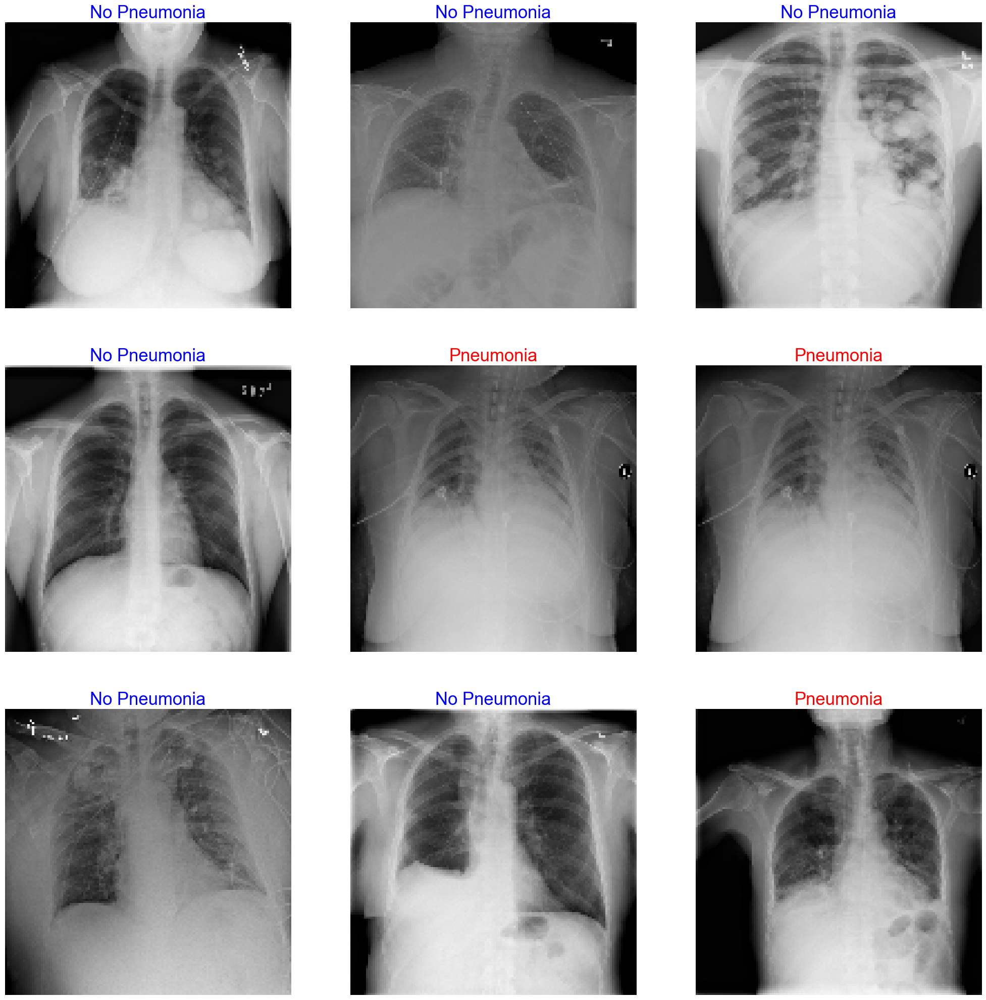

In [134]:
plt.figure(figsize=(25,25)) #
for i, image in enumerate(train_images[:9]):

    plt.subplot(3,3,i+1)
    plt.imshow(image)
    if trainlabels.loc[i]["Target"]:
        plt.title("Pneumonia", color="red", fontsize=25)
    else:
        plt.title("No Pneumonia", color="blue", fontsize=25)
    plt.axis('off')
plt.show()

In [135]:
y = pd.get_dummies(trainlabels["Target"]).values
random_state = 42

X_train, X_test, y_train, y_test = train_test_split(train_images, y, test_size=0.2, random_state=random_state)

# **Building CNN Model**

In [136]:
def recall_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
    recall = true_positives / (possible_positives + K.epsilon())
    return recall

def precision_m(y_true, y_pred):
    true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
    predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
    precision = true_positives / (predicted_positives + K.epsilon())
    return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))

In [137]:
ADJUSTED_IMAGE_SIZE = 128
input_shape = (ADJUSTED_IMAGE_SIZE, ADJUSTED_IMAGE_SIZE, 3)
num_classes = y_train.shape[1]

model = Sequential()
model.add(RandomRotation(factor=0.15))
model.add(Rescaling(1./255))
model.add(Conv2D(32, (3, 3), input_shape=input_shape)) # (3, 3) - conv kernel

model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.2))

model.add(Conv2D(32, (3, 3)))

model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.3))

model.add(Conv2D(64, (3, 3)))

model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Dropout(0.4))

model.add(Flatten())
model.add(Dense(64))
model.add(Activation('relu'))
model.add(Dropout(0.5))
model.add(Dense(num_classes))
model.add(Activation('softmax'))

model.compile(loss='categorical_crossentropy',
              optimizer=tf.keras.optimizers.Adam(learning_rate=0.0005),
              metrics=['accuracy'] # ,f1_m
             )
# model.summary()

history = model.fit(X_train,
                  y_train,
                  epochs = 10,
                  validation_data = (X_test,y_test),
                  batch_size = 16,
                    callbacks=[
                        EarlyStopping(monitor = "val_loss", patience = 10, restore_best_weights = True),
                        ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
                    ]
                   )

fcl_loss, fcl_accuracy = model.evaluate(X_test, y_test, verbose=1) # , fcl_f1
print('Test loss:', fcl_loss)
print('Test accuracy:', fcl_accuracy)
# print('Test F1:', fcl_f1)

df = pd.DataFrame({"pred": np.argmax(model.predict(X_test), axis=1), "true": np.argmax(y_test, axis=1)})
print(classification_report(df["true"], df["pred"]))



Epoch 1/10


1512/1512 [==============================] - 76s 49ms/step - loss: 0.5525 - accuracy: 0.7063 - val_loss: 0.5068 - val_accuracy: 0.7536 - lr: 5.0000e-04
Epoch 2/10
1512/1512 [==============================] - 74s 49ms/step - loss: 0.5128 - accuracy: 0.7537 - val_loss: 0.5169 - val_accuracy: 0.7545 - lr: 5.0000e-04
Epoch 3/10
1512/1512 [==============================] - 74s 49ms/step - loss: 0.4991 - accuracy: 0.7684 - val_loss: 0.4839 - val_accuracy: 0.7645 - lr: 5.0000e-04
Epoch 4/10
1512/1512 [==============================] - 74s 49ms/step - loss: 0.4903 - accuracy: 0.7733 - val_loss: 0.4840 - val_accuracy: 0.7721 - lr: 5.0000e-04
Epoch 5/10
1512/1512 [==============================] - 74s 49ms/step - loss: 0.4829 - accuracy: 0.7775 - val_loss: 0.4775 - val_accuracy: 0.7713 - lr: 5.0000e-04
Epoch 6/10
1512/1512 [==============================] - 74s 49ms/step - loss: 0.4821 - accuracy: 0.7784 - val_loss: 0.4684 - val_accuracy: 0.7749 - lr: 5.0000e-04
Epoch 7/10
1512/15

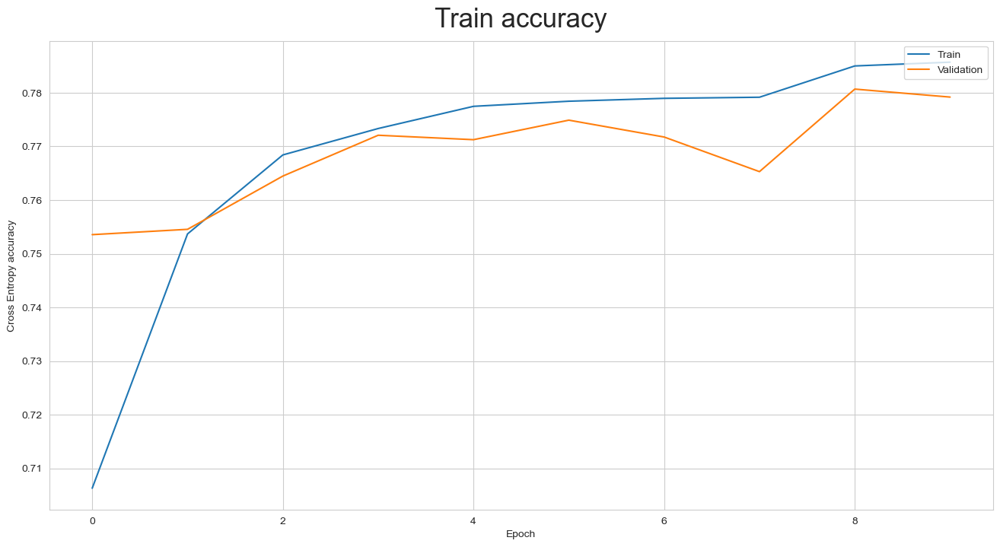

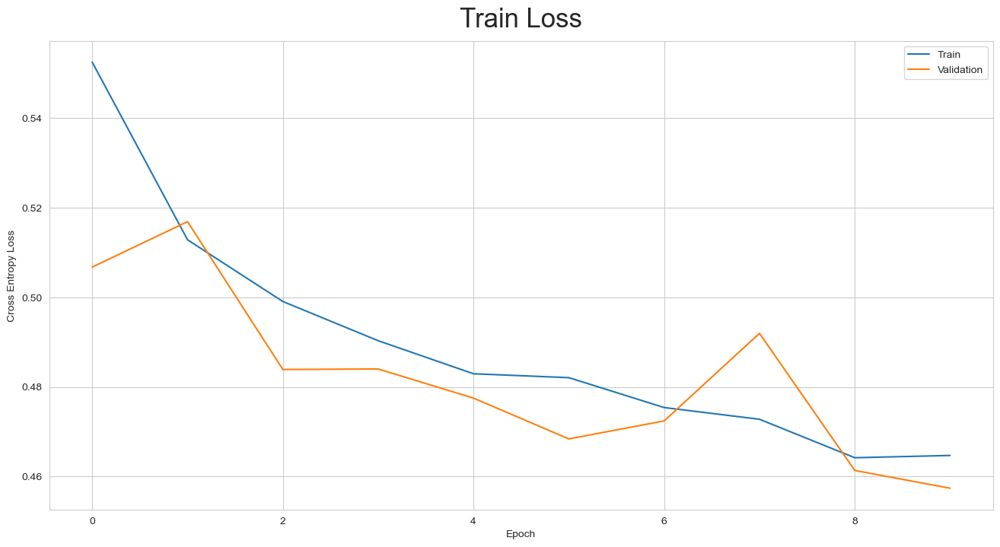

In [138]:
plt.figure(figsize=(16, 8))

plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.ylabel('Cross Entropy accuracy')
plt.xlabel('Epoch')
plt.title('Train accuracy', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()


plt.figure(figsize=(16, 8))

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')
plt.title('Train Loss', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()

**CNN model Accuracy is 78%.**

# 2. Milestone 2:

   ### ‣ Input: Preprocessed output from Milestone-1

### ‣ Process:

‣ Step 1: Fine tune the trained basic CNN models for classification.

‣ Step 2: Apply Transfer Learning model for classification

‣ Step 3: Design, train and test RCNN & its hybrids based object detection models to impose the bounding box or mask over the  area of interest.

‣ Step 4: Pickle the model for future prediction

‣ Step 5: Final Report

‣ Submission: Final report, Jupyter Notebook with all the steps in Milestone-1 and Milestone-2


# Fine tuning model

## ‣ Step 1: Fine tune the trained basic CNN models for classification.

In [142]:
base_model.trainable = True
for layer in base_model.layers:
    if isinstance(layer, BatchNormalization): # set BatchNorm layers as not trainable
        layer.trainable = False

model.compile(optimizer=AdamW(learning_rate=0.00001), # 
                   loss=losses.categorical_crossentropy, 
                   metrics=['accuracy']) # ,f1_m

history = model.fit(X_train,     
                         y_train, 
                         batch_size=16, 
                         epochs=10    , 
                         validation_data=(X_test, y_test),
                         callbacks=[
                             EarlyStopping(monitor = "val_loss", patience = 15, 
                                           restore_best_weights = True, mode='min'),
                             ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
                    ]
                        )

fcl_loss, fcl_accuracy  = model.evaluate(X_test, y_test, verbose=1) # fcl_f1
print('Test loss:', fcl_loss)
print('Test accuracy:', fcl_accuracy)
# print('Test F1:', fcl_f1)

df = pd.DataFrame({"pred": np.argmax(model.predict(X_test), axis=1), "true": np.argmax(y_test, axis=1)})
print(classification_report(df["true"], df["pred"]))

Epoch 1/10
1512/1512 [==============================] - 1714s 1s/step - loss: 0.4116 - accuracy: 0.8086 - val_loss: 0.4389 - val_accuracy: 0.7833 - lr: 1.0000e-05
Epoch 2/10
1512/1512 [==============================] - 1712s 1s/step - loss: 0.3930 - accuracy: 0.8189 - val_loss: 0.4000 - val_accuracy: 0.8255 - lr: 1.0000e-05
Epoch 3/10
1512/1512 [==============================] - 1708s 1s/step - loss: 0.3793 - accuracy: 0.8280 - val_loss: 0.3971 - val_accuracy: 0.8215 - lr: 1.0000e-05
Epoch 4/10
1512/1512 [==============================] - 1710s 1s/step - loss: 0.3714 - accuracy: 0.8311 - val_loss: 0.3992 - val_accuracy: 0.8265 - lr: 1.0000e-05
Epoch 5/10
1512/1512 [==============================] - 1709s 1s/step - loss: 0.3602 - accuracy: 0.8361 - val_loss: 0.3787 - val_accuracy: 0.8306 - lr: 1.0000e-05
Epoch 6/10
1512/1512 [==============================] - 1709s 1s/step - loss: 0.3478 - accuracy: 0.8429 - val_loss: 0.3781 - val_accuracy: 0.8300 - lr: 1.0000e-05
Epoch 7/10
1512/1512 [

We observed accuracy is improved to 83% after fine tuning the model.

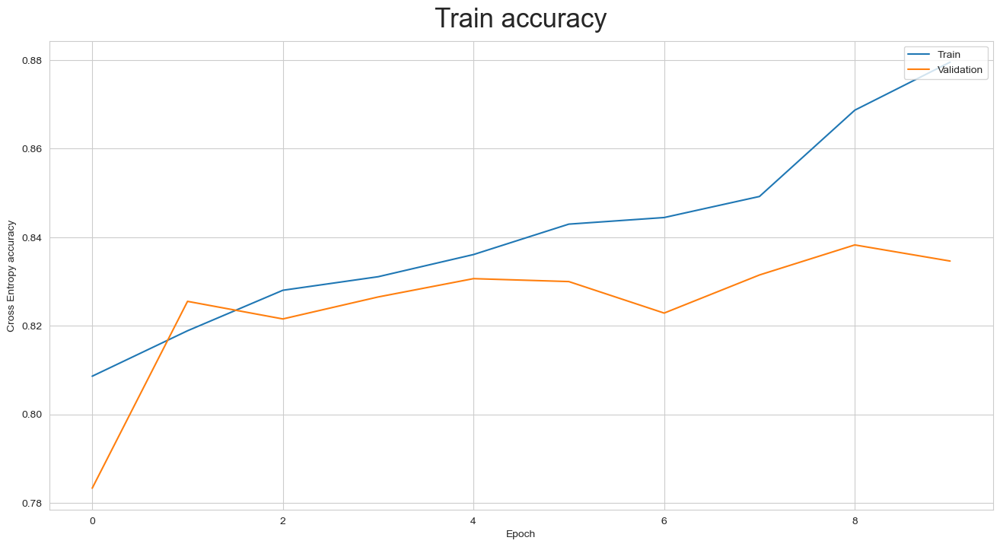

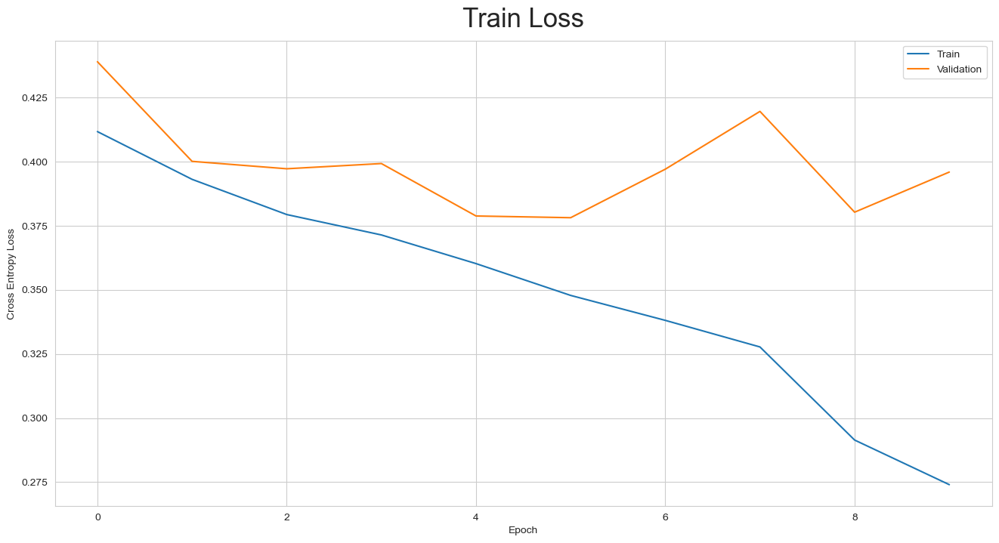

In [143]:
plt.figure(figsize=(16, 8))

plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.ylabel('Cross Entropy accuracy')
plt.xlabel('Epoch')
plt.title('Train accuracy', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()


plt.figure(figsize=(16, 8))

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')
plt.title('Train Loss', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()

# Build transfer-learning model

## Step 2: Applying Transfer Learning model for classification

In [140]:
# potential models: Xception ResNet50V2 InceptionV3 EfficientNetB3 ResNet152 VGG16
base_model = tf.keras.applications.VGG16(weights = 'imagenet', include_top = False)
for layer in base_model.layers:
      layer.trainable = False

# Data Augmentation Step
augment = Sequential([
#   RandomFlip("horizontal"),
#     Rescaling(1./255), # pretrained model already include rescaling
    RandomRotation(0.15)
], name='AugmentationLayer')

inputs = Input(shape = input_shape, name='inputLayer')
x = augment(inputs)
pretrain_out = base_model(x, training = False)
x = Flatten()(pretrain_out)
x = Dense(64, activation='relu')(x)
x = Dense(y_train.shape[1], name='outputLayer')(x)
outputs = Activation(activation="softmax", dtype=tf.float32, name='activationLayer')(x)
model = Model(inputs=inputs, outputs=outputs)

model.compile(optimizer=AdamW(learning_rate=0.0005), # 
                   loss=losses.categorical_crossentropy, 
                   metrics=['accuracy']) # ,f1_m


history = model.fit(X_train, 
                         y_train, 
                         batch_size=16, 
                         epochs=10, 
                         validation_data=(X_test, y_test),
                         callbacks=[
                             EarlyStopping(monitor = "val_loss", patience = 15, 
                                           restore_best_weights = True, mode='min'),
                             ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=2, mode='min')
                    ]
                        )
fcl_loss, fcl_accuracy  = model.evaluate(X_test, y_test, verbose=1) # fcl_f1
print('Test loss:', fcl_loss)
print('Test accuracy:', fcl_accuracy)
# print('Test F1:', fcl_f1)

df = pd.DataFrame({"pred": np.argmax(model.predict(X_test), axis=1), "true": np.argmax(y_test, axis=1)})
print(classification_report(df["true"], df["pred"]))

Epoch 1/10
1512/1512 [==============================] - 536s 354ms/step - loss: 0.5102 - accuracy: 0.7827 - val_loss: 0.4546 - val_accuracy: 0.7952 - lr: 5.0000e-04
Epoch 2/10
1512/1512 [==============================] - 542s 358ms/step - loss: 0.4296 - accuracy: 0.8040 - val_loss: 0.4302 - val_accuracy: 0.8017 - lr: 5.0000e-04
Epoch 3/10
1512/1512 [==============================] - 515s 341ms/step - loss: 0.4187 - accuracy: 0.8045 - val_loss: 0.4569 - val_accuracy: 0.8032 - lr: 5.0000e-04
Epoch 4/10
1512/1512 [==============================] - 509s 337ms/step - loss: 0.4133 - accuracy: 0.8076 - val_loss: 0.4659 - val_accuracy: 0.7885 - lr: 5.0000e-04
Epoch 5/10
1512/1512 [==============================] - 507s 335ms/step - loss: 0.3989 - accuracy: 0.8144 - val_loss: 0.4308 - val_accuracy: 0.8075 - lr: 1.0000e-04
Epoch 6/10
1512/1512 [==============================] - 508s 336ms/step - loss: 0.3953 - accuracy: 0.8153 - val_loss: 0.4447 - val_accuracy: 0.8053 - lr: 1.0000e-04
Epoch 7/10

Applying transfer learning model accuracy improves to 81%.

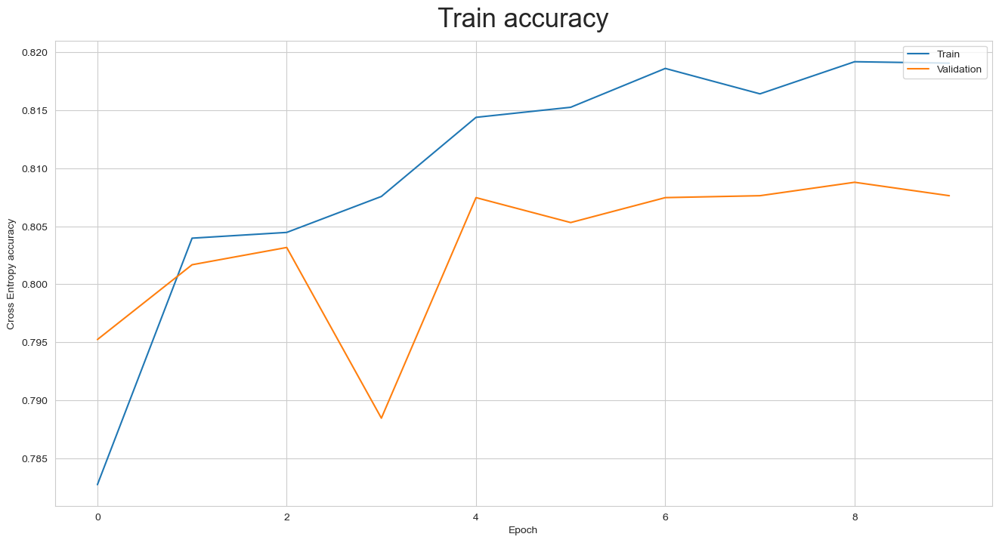

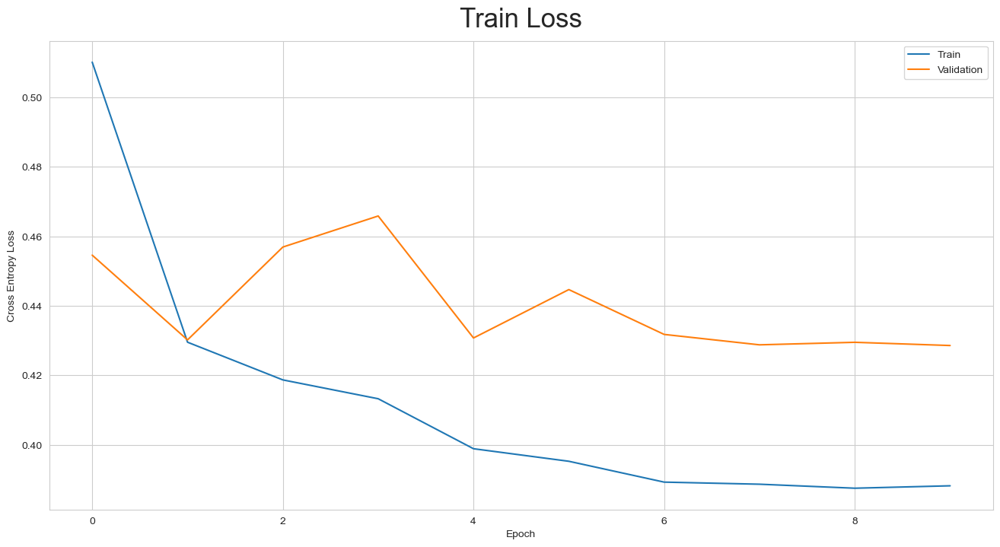

In [141]:
plt.figure(figsize=(16, 8))

plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.ylabel('Cross Entropy accuracy')
plt.xlabel('Epoch')
plt.title('Train accuracy', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()


plt.figure(figsize=(16, 8))

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.ylabel('Cross Entropy Loss')
plt.xlabel('Epoch')
plt.title('Train Loss', pad=13, fontsize=25)
plt.legend(loc='upper right')
plt.grid(000.1)

plt.show()


## Step 3: Design, train and test RCNN & its hybrids based object detection models to impose the bounding box or mask over the area of interest.

In [7]:
import torch
import torchvision
import torchvision.models.detection
import torchvision.models.detection.mask_rcnn
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import time
from torch.optim import Adam

In [8]:
train_df = pd.read_csv(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_labels.csv')

In [9]:
IMAGE_PATH = Path(r'C:\Users\manve\Downloads\rsna-pneumonia-detection-challenge\stage_2_train_images')

In [10]:
IMAGE_SIZE = 1024 #sample_pixel_array.shape[0]
ADJUSTED_IMAGE_SIZE=224
FACTOR = ADJUSTED_IMAGE_SIZE/IMAGE_SIZE

In [11]:
train_df.fillna(0,inplace=True)

In [12]:
train_df['x']            = train_df['x'].astype('int');
train_df['y']            = train_df['y'].astype('int');
train_df['width']        = train_df['width'].astype('int');
train_df['height']       = train_df['height'].astype('int');

In [13]:
print('Original dataframe shape:', train_df.shape)

train_labels_df_pos = pd.DataFrame(columns=['patientId', 'x', 'y', 'width', 'height'])

k = 0
for i in range(len(train_df)):
    if train_df.iloc[i]['Target'] == 1:
        train_labels_df_pos.loc[k] = train_df.loc[i]
        k += 1

print('Positive instances dataframe shape:', train_labels_df_pos.shape)
#train_paths = [os.path.join(IMAGE_PATH, image[0]) for image in train_labels_df_pos.values]

Original dataframe shape: (30227, 6)
Positive instances dataframe shape: (9555, 5)


In [14]:
train_labels_df_pos['x']            = train_labels_df_pos['x'].astype('int');
train_labels_df_pos['y']            = train_labels_df_pos['y'].astype('int');
train_labels_df_pos['width']        = train_labels_df_pos['width'].astype('int');
train_labels_df_pos['height']       = train_labels_df_pos['height'].astype('int');

In [15]:
from torch.utils.data import DataLoader, Dataset
class PneumoniaDataset(Dataset):
    def __init__(self, dataframe, image_dir, transforms=None):
        super().__init__()

        self.image_ids = dataframe['patientId'].unique()
        self.df = dataframe
        self.image_dir = image_dir
        self.transforms = transforms

    def __getitem__(self, index):
        # load images and bounding boxes
        image_id = self.image_ids[index]
        records = self.df[self.df['patientId'] == image_id]

        dicom_data = pydicom.read_file(os.path.join(self.image_dir + '%s.dcm' % image_id))

        img = dicom_data.pixel_array
        img = cv2.resize(img, (ADJUSTED_IMAGE_SIZE, ADJUSTED_IMAGE_SIZE))

        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB).astype(np.float32)
        img /= 255.0
        boxes = records[['x', 'y', 'width', 'height']].values
        boxes[:, 2] = boxes[:, 0] + boxes[:, 2]
        boxes[:, 3] = boxes[:, 1] + boxes[:, 3]

        #Resizing
        boxes[:, 0]=boxes[:, 0].astype(np.int32)* FACTOR
        boxes[:, 1]=boxes[:, 1].astype(np.int32)* FACTOR
        boxes[:, 2]=boxes[:, 2].astype(np.int32)* FACTOR
        boxes[:, 3]=boxes[:, 3].astype(np.int32)* FACTOR
        boxes=np.vstack(boxes).astype(np.float32)
        #print("Final co:")
        #print(boxes[:,0],boxes[:,2],boxes[:,1],boxes[:,3])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        area = np.vstack(area).astype(np.float32)
        area = torch.as_tensor(area, dtype=torch.float32)


        # there is only one class
        labels = torch.ones((records.shape[0],), dtype=torch.int64)
        # suppose all instances are not crowd
        iscrowd = torch.zeros((records.shape[0],), dtype=torch.int64)

        target = {}
        target['boxes'] = boxes
        target['labels'] = labels
        target['patientId'] = torch.tensor([index])
        target['area'] = area
        target['iscrowd'] = iscrowd

        if self.transforms:
            sample = {
                'image': img,
                'bboxes': target['boxes'],
                'labels': labels
            }
            sample = self.transforms(**sample)
            img = sample['image']

            target['boxes'] = torch.stack(tuple(map(torch.FloatTensor, zip(*sample['bboxes'])))).permute(1, 0)

        return img, target


    def __len__(self):
        return self.image_ids.shape[0]

# Albumentations
def get_train_transform():
    return A.Compose([
        A.Resize(width=ADJUSTED_IMAGE_SIZE,height=ADJUSTED_IMAGE_SIZE),
        A.Flip(0.5),
        A.RandomRotate90(0.5),
        A.MotionBlur(p=0.2),
        A.MedianBlur(blur_limit=3, p=0.1),
        A.Blur(blur_limit=3, p=0.1),
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})

def get_valid_transform():
    return A.Compose([
        A.Resize(width=ADJUSTED_IMAGE_SIZE,height=ADJUSTED_IMAGE_SIZE),
        ToTensorV2(p=1.0)
    ], bbox_params={'format': 'pascal_voc', 'label_fields': ['labels']})
def collate_fn(batch):
    return tuple(zip(*batch))

class Averager:
    def __init__(self):
        self.current_total = 0.0
        self.iterations = 0.0

    def send(self, value):
        self.current_total += value
        self.iterations += 1

    @property
    def value(self):
        if self.iterations == 0:
            return 0
        else:
            return 1.0 * self.current_total / self.iterations

    def reset(self):
        self.current_total = 0.0
        self.iterations = 0.0

In [16]:
#!pip install albumentations
#It takes a list of patients with pneumonia, splits them into two groups—one for training the model and the other for validating its performance. The sizes of these groups are printed out. Then, it creates datasets for training and validation using these patient groups and applies some image transformations to make the model more robust. Finally, it sets up data loaders, which help efficiently feed batches of data to the model during training and validation. The printed messages provide information about how many patients are in each group and how many examples are available for the model to learn from.

In [17]:
import albumentations as A
from albumentations.pytorch.transforms import ToTensorV2


image_ids = train_labels_df_pos['patientId'].unique()
valid_ids = image_ids[-300:]
train_ids = image_ids[:-300]
print(f"Training instance: {len(train_ids)}")
print(f"Validation instances: {len(valid_ids)}")

valid_df = train_labels_df_pos[train_labels_df_pos['patientId'].isin(valid_ids)]
train_df = train_labels_df_pos[train_labels_df_pos['patientId'].isin(train_ids)]

print('Train dataframe shape:', train_df.shape)
print('Valid dataframe shape:', valid_df.shape)

train_dataset = PneumoniaDataset(train_df, IMAGE_PATH, get_train_transform())
valid_dataset = PneumoniaDataset(valid_df, IMAGE_PATH, get_valid_transform())
print('train_dataset and valid_dataset are loaded :)')
print("We have: {} training examples and {} validation examples".format(len(train_dataset), len(valid_dataset)))

train_data_loader = DataLoader(train_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)
valid_data_loader = DataLoader(valid_dataset, batch_size=8, shuffle=False, num_workers=2, collate_fn=collate_fn)

Training instance: 5712
Validation instances: 300
Train dataframe shape: (9057, 5)
Valid dataframe shape: (498, 5)
train_dataset and valid_dataset are loaded :)
We have: 5712 training examples and 300 validation examples


In [18]:
def calculate_image_precision(gts, preds, thresholds = (0.5, ), form = 'coco') -> float:
    # https://www.kaggle.com/sadmanaraf/wheat-detection-using-faster-rcnn-train
    """Calculates image precision.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        thresholds: (float) Different thresholds
        form: (str) Format of the coordinates

    Return:
        (float) Precision
    """
    n_threshold = len(thresholds)
    image_precision = 0.0

    ious = np.ones((len(gts), len(preds))) * -1
    # ious = None

    for threshold in thresholds:
        precision_at_threshold = calculate_precision(gts.copy(), preds, threshold=threshold,
                                                     form=form, ious=ious)
        image_precision += precision_at_threshold / n_threshold

    return image_precision


def calculate_iou(gt, pr, form='pascal_voc') -> float:
    # https://www.kaggle.com/sadmanaraf/wheat-detection-using-faster-rcnn-train
    """Calculates the Intersection over Union.

    Args:
        gt: (np.ndarray[Union[int, float]]) coordinates of the ground-truth box
        pr: (np.ndarray[Union[int, float]]) coordinates of the prdected box
        form: (str) gt/pred coordinates format
            - pascal_voc: [xmin, ymin, xmax, ymax]
            - coco: [xmin, ymin, w, h]
    Returns:
        (float) Intersection over union (0.0 <= iou <= 1.0)
    """
    if form == 'coco':
        gt = gt.copy()
        pr = pr.copy()

        gt[2] = gt[0] + gt[2]
        gt[3] = gt[1] + gt[3]
        pr[2] = pr[0] + pr[2]
        pr[3] = pr[1] + pr[3]

    # Calculate overlap area
    dx = min(gt[2], pr[2]) - max(gt[0], pr[0]) + 1

    if dx < 0:
        return 0.0
    dy = min(gt[3], pr[3]) - max(gt[1], pr[1]) + 1

    if dy < 0:
        return 0.0

    overlap_area = dx * dy

    # Calculate union area
    union_area = (
            (gt[2] - gt[0] + 1) * (gt[3] - gt[1] + 1) +
            (pr[2] - pr[0] + 1) * (pr[3] - pr[1] + 1) -
            overlap_area
    )

    return overlap_area / union_area


def find_best_match(gts, pred, pred_idx, threshold = 0.5, form = 'pascal_voc', ious=None) -> int:
    # https://www.kaggle.com/sadmanaraf/wheat-detection-using-faster-rcnn-train
    """Returns the index of the 'best match' between the
    ground-truth boxes and the prediction. The 'best match'
    is the highest IoU. (0.0 IoUs are ignored).

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        pred: (List[Union[int, float]]) Coordinates of the predicted box
        pred_idx: (int) Index of the current predicted box
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (int) Index of the best match GT box (-1 if no match above threshold)
    """
    best_match_iou = -np.inf
    best_match_idx = -1
    for gt_idx in range(len(gts)):

        if gts[gt_idx][0] < 0:
            # Already matched GT-box
            continue

        iou = -1 if ious is None else ious[gt_idx][pred_idx]

        if iou < 0:
            iou = calculate_iou(gts[gt_idx], pred, form=form)

            if ious is not None:
                ious[gt_idx][pred_idx] = iou

        if iou < threshold:
            continue

        if iou > best_match_iou:
            best_match_iou = iou
            best_match_idx = gt_idx

    return best_match_idx

def calculate_precision(gts, preds, threshold = 0.5, form = 'coco', ious=None) -> float:
    # https://www.kaggle.com/sadmanaraf/wheat-detection-using-faster-rcnn-train
    """Calculates precision for GT - prediction pairs at one threshold.

    Args:
        gts: (List[List[Union[int, float]]]) Coordinates of the available ground-truth boxes
        preds: (List[List[Union[int, float]]]) Coordinates of the predicted boxes,
               sorted by confidence value (descending)
        threshold: (float) Threshold
        form: (str) Format of the coordinates
        ious: (np.ndarray) len(gts) x len(preds) matrix for storing calculated ious.

    Return:
        (float) Precision
    """
    n = len(preds)
    tp = 0
    fp = 0

    for pred_idx in range(n):

        best_match_gt_idx = find_best_match(gts, preds[pred_idx], pred_idx,
                                            threshold=threshold, form=form, ious=ious)

        if best_match_gt_idx >= 0:
            # True positive: The predicted box matches a gt box with an IoU above the threshold.
            tp += 1
            # Remove the matched GT box
            gts[best_match_gt_idx] = -1
        else:
            # No match
            # False positive: indicates a predicted box had no associated gt box.
            fp += 1

    # False negative: indicates a gt box had no associated predicted box.
    fn = (gts.sum(axis=1) > 0).sum()

    return tp / (tp + fp + fn)

In [19]:
def train(dataloader, lr_scheduler, model, optimizer,
          device, epoch, loss_hist, itr):
    model.train()
    start = time.time()
    loss_hist.reset()
    for images, targets in dataloader:
        images = list(image.to(device) for image in images)
        targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
        loss_dict = model(images, targets)
        losses = sum(loss for loss in loss_dict.values())
        loss_value = losses.item()
        loss_hist.send(loss_value)
        optimizer.zero_grad()
        losses.backward()
        optimizer.step()
        if itr % 100 == 0:
            print(f"Epoch #{epoch} iteration #{itr} loss: {loss_value}")
        itr += 1
    end = time.time()
    return loss_hist, end, start

def validate(dataloader, model, device, iou_thresholds):
    valid_image_precision = []
    model.eval()
    with torch.no_grad():
        for images, targets in dataloader:

            images = list(image.to(device) for image in images)
            targets = [{k: v.to(device) for k, v in t.items()} for t in targets]

            outputs = model(images)
    for i, image in enumerate(images):
        boxes = outputs[i]['boxes'].data.cpu().numpy()
        scores = outputs[i]['scores'].data.cpu().numpy()
        gt_boxes = targets[i]['boxes'].cpu().numpy()
        preds_sorted_idx = np.argsort(scores)[::-1]
        preds_sorted = boxes[preds_sorted_idx]
        image_precision = calculate_image_precision(preds_sorted,
                                                        gt_boxes,
                                                        thresholds=iou_thresholds,
                                                        form='coco')
        valid_image_precision.append(image_precision)

    valid_prec = np.mean(valid_image_precision)
    return valid_prec

In [20]:
torch.cuda.is_available()
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
def get_model():
    # load the COCO pre-trained model
    model = torchvision.models.detection.fasterrcnn_resnet50_fpn_v2(weights='DEFAULT')
    # one class is pneumonia, and the other is background
    num_classes = 2
    # get the input features for the classifier
    in_features = model.roi_heads.box_predictor.cls_score.in_features
    # replace pre-trained head with our features head
    # the head layer will classify the images based on our data input features
    model.roi_heads.box_predictor = FastRCNNPredictor(in_features, num_classes)
    return model

In [ ]:
# learning parameters
num_epochs = 8
lr = 0.001
batch_size = 6
train_loss = []
precision = []

# initialize the Averager
loss_hist = Averager()
iou_thresholds = [x for x in np.arange(0.5, 0.76, 0.05)]

model = get_model().to(device)
params = [p for p in model.parameters() if p.requires_grad]
optimizer = torch.optim.SGD(params, lr=lr, momentum=0.9, weight_decay=0.0005)
lr_scheduler = None

for epoch in range(num_epochs):
    itr = 1
    train_loss_hist, end, start = train(train_data_loader, lr_scheduler,
                                        model, optimizer, device,
                                        epoch, loss_hist, itr)
    valid_prec = validate(valid_data_loader, model, device, iou_thresholds)
    print(f"Took {(end-start)/60:.3f} minutes for epoch# {epoch} to train")
    print(f"Epoch #{epoch} Train loss: {train_loss_hist.value}")
    print(f"Epoch #{epoch} Validation Precision: {valid_prec}")
    train_loss.append(train_loss_hist.value)
    precision.append(valid_prec)

    # update the learning rate
    if lr_scheduler is not None:
        lr_scheduler.step()

torch.save(model.state_dict(), 'fasterrcnn_resnet50_fpn_pneumonia_detection.pth')

In [ ]:
# plot the training loss
plt.figure()
plt.plot(train_loss, label='Training loss')
plt.legend()
plt.show()

# plot the validation precision
plt.figure()
plt.plot(precision, label='Validation precision')
plt.legend()
plt.show()

In [29]:
images_test_path = 'C:/Users/manve/Downloads/rsna-pneumonia-detection-challenge/stage_2_test_images/'

In [ ]:
images_test_path = 'C:/Users/manve/Downloads/rsna-pneumonia-detection-challenge/stage_2_test_images/'
test_images = os.listdir(images_test_path)
print(f"Validation instances: {len(test_images)}")

# # load a model; pre-trained on COCO
model = get_model()

# # os.makedirs('../validation_predictions', exist_ok=True)
model.load_state_dict(torch.load('fasterrcnn_resnet50_fpn_pneumonia_detection.pth'))
model.to(device)

In [22]:
def format_prediction_string(boxes, scores):
    pred_strings = []
    for j in zip(scores, boxes):
        pred_strings.append("{0:.4f} {1} {2} {3} {4}".format(j[0],
                                                             int(j[1][0]), int(j[1][1]),
                                                             int(j[1][2]), int(j[1][3])))

    return " ".join(pred_strings)

In [ ]:
 detection_threshold = 0.8
 results = []
 model.eval()
 f, axarr = plt.subplots(10, 3, figsize=(24,36))
 axarr = axarr.ravel()
 axidx = 0
 with torch.no_grad():
    for i, image in tqdm(enumerate(test_images), total=len(test_images)):

         # plot image
         ID = "ID: ",format(image)
         #orig_image = cv2.imread(f"{images_test_path}/{test_images[i]}", cv2.IMREAD_COLOR)
         orig_image = pydicom.read_file(os.path.join(images_test_path + '%s' % image))
         image = orig_image.pixel_array
         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
         image /= 255.0
         image = np.transpose(image, (2, 0, 1)).astype(np.float32)
         image = torch.tensor(image, dtype=torch.float).cuda()
         image = torch.unsqueeze(image, 0)

         model.eval()
         cpu_device = torch.device("cpu")

         outputs = model(image)

         outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
         if len(outputs[0]['boxes']) != 0:
             for counter in range(len(outputs[0]['boxes'])):
                 boxes = outputs[0]['boxes'].data.cpu().numpy()
                 scores = outputs[0]['scores'].data.cpu().numpy()
                 boxes = boxes[scores >= detection_threshold].astype(np.int32)
                 draw_boxes = boxes.copy()
                 boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
                 boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
                 #print(image.shape)
                 #print(boxes)
                 draw_boxes = boxes.copy()
                 axarr[axidx].imshow(cv2.cvtColor(orig_image.pixel_array, cv2.COLOR_BGR2RGB))
                 axarr[axidx].set_title(ID)

                 for box in draw_boxes:
                    rectangle = Rectangle(xy= ((int(box[0]), int(box[1]))),width=int(box[2]),
                                          height=int(box[3]), color="red",alpha = 0.1)
                    axarr[axidx].add_patch(rectangle)

             axidx+=1
             result = {
                'patientId': test_images[i].split('.')[0],
                'PredictionString': format_prediction_string(boxes, scores)
            }
             results.append(result)
         else:
             result = {
                'patientId': test_images[i].split('.')[0],
                'PredictionString': None
            }
             results.append(result)
         i=i+1
         #exit after 32 images
         if i>29:
             break


In [ ]:
detection_threshold = 0.8
 results = []
 model.eval()
 with torch.no_grad():
    for i, image in tqdm(enumerate(test_images), total=len(test_images)):

         # plot image
         orig_image = pydicom.read_file(os.path.join(images_test_path + '%s' % image))
         image = orig_image.pixel_array

         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
         image /= 255.0
         image = np.transpose(image, (2, 0, 1)).astype(np.float32)
         image = torch.tensor(image, dtype=torch.float).cuda()
         image = torch.unsqueeze(image, 0)

         model.eval()
         cpu_device = torch.device("cpu")

         outputs = model(image)

         outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
         if len(outputs[0]['boxes']) != 0:
             for counter in range(len(outputs[0]['boxes'])):
                 boxes = outputs[0]['boxes'].data.cpu().numpy()
                 scores = outputs[0]['scores'].data.cpu().numpy()
                 boxes = boxes[scores >= detection_threshold].astype(np.int32)
                 draw_boxes = boxes.copy()
                 boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
                 boxes[:, 3] = boxes[:, 3] - boxes[:, 1]

                 draw_boxes = boxes.copy()

             result = {
                'patientId': test_images[i].split('.')[0],
                'PredictionString': format_prediction_string(boxes, scores)
            }
             results.append(result)
         else:
             result = {
                'patientId': test_images[i].split('.')[0],
                'PredictionString': ''
            }
             results.append(result)

 sub_df = pd.DataFrame(results, columns=['patientId', 'PredictionString'])
 print(sub_df.head())
 sub_df.to_csv('submission_frcnn.csv', index=False)

In [ ]:
sub_df

In [ ]:
sub_df[sub_df['PredictionString']!='']

In [32]:
validation_threshold=0.8
def show_pred_image_with_bboxes(patientId,axarr,axidx):
    with torch.no_grad():
        ID = "Predicted: ",format(patientId)

        orig_image = pydicom.read_file(os.path.join(IMAGE_PATH + '%s.dcm' % patientId))
        image = orig_image.pixel_array

        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB).astype(np.float32)
        image /= 255.0
        image = np.transpose(image, (2, 0, 1)).astype(np.float32)
        image = torch.tensor(image, dtype=torch.float).cuda()
        image = torch.unsqueeze(image, 0)

        model.eval()
        cpu_device = torch.device("cpu")

        outputs = model(image)

        outputs = [{k: v.to(cpu_device) for k, v in t.items()} for t in outputs]
        if len(outputs[0]['boxes']) != 0:
            for counter in range(len(outputs[0]['boxes'])):
                boxes = outputs[0]['boxes'].data.cpu().numpy()
                scores = outputs[0]['scores'].data.cpu().numpy()
                boxes = boxes[scores >= validation_threshold].astype(np.int32)
                draw_boxes = boxes.copy()
                boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
                boxes[:, 3] = boxes[:, 3] - boxes[:, 1]
                draw_boxes = boxes.copy()
                axarr[axidx].imshow(cv2.cvtColor(orig_image.pixel_array, cv2.COLOR_BGR2RGB))
                axarr[axidx].set_title(ID)

                for box in draw_boxes:
                    rectangle = Rectangle(xy= ((int(box[0]), int(box[1]))),width=int(box[2]),
                                          height=int(box[3]), color="red",alpha = 0.1)
                    axarr[axidx].add_patch(rectangle)

In [ ]:
def show_image_with_bboxes(patientId,axarr,axidx):
        ID = "Actual: ",format(patientId)
        id_= np.random.choice(train_labels_df_pos['patientId'].values)
        orig_image = pydicom.read_file(os.path.join(IMAGE_PATH + '%s.dcm' % patientId))
        image = orig_image.pixel_array
        axarr[axidx].imshow(cv2.cvtColor(orig_image.pixel_array, cv2.COLOR_BGR2RGB))
        axarr[axidx].set_title(ID)
        boxes=train_labels_df_pos[['x','y','width','height']][train_labels_df_pos['patientId']==id_].values
        for box in boxes:
            x=box[0]
            y=box[1]
            w=box[2]
            h=box[3]
            axarr[axidx].add_patch(plt.Rectangle((x, y), w, h, color='red', fill=False, linewidth=3))

In [ ]:
dataset = valid_df
f, axarr = plt.subplots(6, 2, figsize=(16,36))
axarr = axarr.ravel()
axidx = 0

image_id = valid_df.sample(6)['patientId'].reset_index(drop=True)
for i in range(6):

    show_image_with_bboxes(image_id[i],axarr,axidx)
    axidx+=1
    show_pred_image_with_bboxes(image_id[i],axarr,axidx)
    axidx+=1

In [297]:
import pickle

In [ ]:
pickle.dump(model, open('model.pkl', 'wb'))

In [ ]:
# Loading model to compare the results
pickled_model = pickle.load(open('model.pkl', 'rb'))
pickled_model.predict(X_test)

## Project Conclusion and future work


We tried various models to achieve our goal of building a model with minimal computational resources so that faster and accurate results can be brought out in the healthcare industry, especially the imaging side as it is very computationally heavy. Using the existing data, it was possible to train several models with different configurations and parameters whose accuracies vary between ∼74% and ∼97%; we can conclude that the model's capabilities can be expanded if sufficient training data and advanced computational capability to run further iterations is available as the loss was still decreasing.

In this work, we have presented our approach for identifying pneumonia and understanding how the lung image size plays an important role for the model performance. We found that the distinction is quite subtle for images among presence or absence of pneumonia, large image can be more beneficial for deeper information. However, the computation cost also burden exponentially when dealing with large image.

Our proposed architecture with regional context RCNN with selective search supplied extra context for generating accurate results. Also, using thresholds in background while training tuned our network to perform well in this task. With the usage of image augmentation, dropout and L2 regularization prevented the overfitting, but are obtained something weaker results on the training set with respect to the test. Our model can be improved by adding new layers, but this would introduce even more hyperparameters that should be adjusted. We intend to extend our model architecture in other areas of medical imaging with the usage of deep learning and computer vision techniques.

RCNN with selective search has very limited application for Dicom image analysis due to its architecture. The performance of other models has been better as compared to RCNN. Yolov3 was able to predict the test images with good performance. But Faster-RCNN predicted 1098 test images out of 3000 samples with high confidence score. Hence, both YOLO and Faster RCNN can be taken up for further tuning in next phase of project.

Improvements Area:

Due to memory and GPU requirements, not all training data could be loaded. This can be fully used for better model training.
Running the training for more epocs with higher patience levels
Increasing the image dimension being used from 224 to 512px or above.
Stratified sampling of data for training gives the model less opportunity of learning the needed feature in turn leaving the model with fewer accuracies as here only 1/3rd data is of the positive class.
Different variants of image augmentation can be tried.
While the results are promising, there are several avenues for future research: • Clinical Validation: Our model needs to be tested in a real-world clinical setting to assess its efficacy and reliability further. • Model Explainability: Future work can also focus on making the model more interpretable for clinicians, possibly through the use of attention mechanisms or other explainability techniques. • Multi-Modal Approaches: Incorporating additional data types, like patient history or other diagnostic tests, could potentially improve the model's predictive power. • Low-Resource Settings: Optimizing the model for deployment in low-resource settings could have a significant impact, making high-quality diagnosis accessible to underserved populations.

In future, it would be interesting to see or use medical dataset repository as it would be instrumental in advancing computer vision and deep learning research for medical field. As more and more advanced architectures are emerging, we can look at more accurate classification and localization models to diagnose pneumonia. We could also look at a historical progressive monitoring of the patient and affected region, assisting the pulmonologist in a visual analysis of the patient’s on-going condition.